<a href="https://colab.research.google.com/github/pachterlab/CWGFLHGCCHAP_2021/blob/master/notebooks/CellAtlasAnalysis/starvation_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!date

Sat Nov 21 21:38:02 UTC 2020


In [1]:
import requests
from tqdm import tnrange, tqdm_notebook
def download_file(doi,ext):
    url = 'https://api.datacite.org/dois/'+doi+'/media'
    r = requests.get(url).json()
    netcdf_url = r['data'][0]['attributes']['url']
    r = requests.get(netcdf_url,stream=True)
    #Set file name
    fname = doi.split('/')[-1]+ext
    #Download file with progress bar
    if r.status_code == 403:
        print("File Unavailable")
    if 'content-length' not in r.headers:
        print("Did not get file")
    else:
        with open(fname, 'wb') as f:
            total_length = int(r.headers.get('content-length'))
            pbar = tnrange(int(total_length/1024), unit="B")
            for chunk in r.iter_content(chunk_size=1024):
                if chunk:
                    pbar.update()
                    f.write(chunk)
        return fname

In [2]:
 #Starvation h5ad data, all nonzero genes included, filtered for 'real cells' from de-multiplexing
#!wget --quiet https://caltech.box.com/shared/static/3l60szs0e9hgaax4q9dbuehgoo092xww
download_file('10.22002/D1.1797','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1797.gz'

In [3]:
#CellRanger Starvation h5ad data
#!wget --quiet https://caltech.box.com/shared/static/ts2i8pid7uky28kke4duyl8jwugx8z4h
download_file('10.22002/D1.1798','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1798.gz'

In [4]:
#Kallisto bus clustered starvation data, h5ad
#!wget --quiet https://caltech.box.com/shared/static/glwk0aln8a3osfuffab73a47js8n0f4w
download_file('10.22002/D1.1796','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1796.gz'

In [5]:
#Human ortholog annotations
#!wget --quiet https://caltech.box.com/shared/static/slxs7968tths1xotumohnzwy6pgdtk6k
download_file('10.22002/D1.1819','.gz')

#Panther annotations
#!wget --quiet https://caltech.box.com/shared/static/vx2iztm7tsyvg7rcj93h2w3hhjhn7jnt
download_file('10.22002/D1.1820','.gz')

#GO Terms
#!wget --quiet https://caltech.box.com/shared/static/0ly6k9iwo1nc9dp5zxo8sw7qe0gt4oof
download_file('10.22002/D1.1822','.gz')

#Saved DeSeq2 Results for Fed/Starved (Differentially expressed under starvation --> perturbed genes)
#!wget --quiet https://caltech.box.com/shared/static/vy27o8yx0tb1ub3ifug770y32kr8o833
download_file('10.22002/D1.1810','.gz')

#Saved gene modules adata
#!wget --quiet https://caltech.box.com/shared/static/y31aalvo382do9pyjnbksff606cd1ydh
download_file('10.22002/D1.1813','.gz')

#Gene Markers to plot (for cell atlas) --> Fig 2 heatmap
# !wget --quiet https://caltech.box.com/shared/static/fir0k32obqmj75n2jss6q5ti18zs7dxl
# !mv fir0k32obqmj75n2jss6q5ti18zs7dxl D1.1809
download_file('10.22002/D1.1809','.gz')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:18: TqdmDeprecationWarning: Please use `tqdm.notebook.trange` instead of `tqdm.tnrange`


'D1.1809.gz'

In [6]:
!gunzip *.gz

In [7]:
!pip install --quiet anndata
!pip install --quiet scanpy
!pip install --quiet louvain

     |████████████████████████████████| 122kB 8.1MB/s 
     |████████████████████████████████| 10.2MB 7.5MB/s 
     |████████████████████████████████| 51kB 4.5MB/s 
     |████████████████████████████████| 71kB 6.8MB/s 
     |████████████████████████████████| 2.2MB 9.3MB/s 
     |████████████████████████████████| 3.2MB 41.7MB/s 


In [8]:
!pip3 install --quiet rpy2

###**Import Packages** 

In [9]:
import pandas as pd
import anndata
import scanpy as sc
import numpy as np
import scipy.sparse

import warnings
warnings.filterwarnings('ignore')

from sklearn.neighbors import (KNeighborsClassifier,NeighborhoodComponentsAnalysis)
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

from sklearn.preprocessing import scale

import random

import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
%matplotlib inline
sc.set_figure_params(dpi=125)

import seaborn as sns
sns.set(style="whitegrid")
%load_ext rpy2.ipython

In [ ]:
# # See version of all installed packages, last done 01/11/2021
# !pip list -v > pkg_vers_20210111.txt

In [ ]:
#Read in annotations
from io import StringIO

hg_ortho_df = pd.read_csv(StringIO(''.join(l.replace('|', '\t') for l in open('D1.1819'))),
            sep="\t",header=None,skiprows=[0,1,2,3])

hg_ortho_df[['XLOC','TCONS']] = hg_ortho_df[13].str.split(expand=True) 
hg_ortho_df[['Gene','gi']] = hg_ortho_df[3].str.split(expand=True) 
hg_ortho_df['Description']= hg_ortho_df[11]


panther_df = pd.read_csv('D1.1820',
            sep="\t",header=None) #skiprows=[0,1,2,3]



goTerm_df = pd.read_csv('D1.1822',
            sep=" ",header=None) #skiprows=[0,1,2,3]

####**How Gene Filtering & Clustering Was Done for Kallisto Processed Data**

In [ ]:
#Read in starvation data

#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("D1.1797")
print(bus_fs_raw )



#CellRanger h5ad file with old louvain clustering
cellRanger_fs = anndata.read("D1.1798")
print(cellRanger_fs)

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'
AnnData object with n_obs × n_vars = 13673 × 2657
    obs: 'n_counts', 'n_countslog', 'louvain', 'orgID', 'fed', 'starved', 'fed_ord', 'starved_ord', 'new_fed', 'fed_neighbor_score'
    var: 'n_counts', 'n_cells'
    uns: 'fed_ord_colors', 'louvain', 'louvain_colors', 'louvain_sizes', 'neighbors', 'new_fed_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'starved_ord_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


Apply labels from ClickTags (organism number and condition)

In [ ]:
bus_fs_raw.obs['orgID'] = pd.Categorical(cellRanger_fs.obs['orgID'])
bus_fs_raw.obs['fed'] = pd.Categorical(cellRanger_fs.obs['fed'])
bus_fs_raw.obs['starved'] = pd.Categorical(cellRanger_fs.obs['starved'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(cellRanger_fs.obs['louvain'])
bus_fs_raw

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain'

In [ ]:
sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
sc.pp.filter_genes(bus_fs_raw, min_counts=0)

In [ ]:
bus_fs_raw_sub = bus_fs_raw[bus_fs_raw.obs['fed'] == True]
bus_fs_raw_sub2 = bus_fs_raw[bus_fs_raw.obs['fed'] == False]
bus_fs_raw_sub2


View of AnnData object with n_obs × n_vars = 7062 × 46716
    obs: 'batch', 'orgID', 'fed', 'starved', 'cellRanger_louvain', 'n_counts'
    var: 'n_counts'

In [ ]:
print('Fed reads:' + str(sum(bus_fs_raw_sub.obs['n_counts'])))
print('Starved reads:' + str(sum(bus_fs_raw_sub2.obs['n_counts'])))

Fed reads:37119861.0
Starved reads:30254873.0


In [ ]:
print('Fed cells: '+str(len(bus_fs_raw_sub.obs_names)))
print('Starved cells: '+str(len(bus_fs_raw_sub2.obs_names)))

Fed cells: 6611
Starved cells: 7062


In [ ]:
#Median Genes/cell
nonZero = bus_fs_raw.X.todense() != 0.0
nonZeroCounts = np.sum(nonZero,axis=1)
nonZeroCounts.shape
print('Median genes/cell:' + str(np.median(list(nonZeroCounts))))

Median genes/cell:676.0


In [ ]:
#Median UMIs/cell
print('Median UMIs/cell:' + str(np.median(bus_fs_raw.obs['n_counts'])))

Median UMIs/cell:1802.0


Filter for highly variable genes and apply cluster labels

In [ ]:
#Find highly variable genes from all nonzero genes

#How annotated/filtered adata was made

#sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
#sc.pp.filter_genes(bus_fs_raw, min_counts=0)
bus_fs_raw.obs['n_countslog']=np.log10(bus_fs_raw.obs['n_counts'])

bus_fs_raw.raw = sc.pp.log1p(bus_fs_raw, copy=True)
sc.pp.normalize_per_cell(bus_fs_raw, counts_per_cell_after=1e4)
filter_result = sc.pp.filter_genes_dispersion(
    bus_fs_raw.X, min_mean=0.0125, max_mean=4.5, min_disp=0.2)
sc.pl.filter_genes_dispersion(filter_result)

In [ ]:
#Filter genes from anndata
bus_fs_raw = bus_fs_raw[:, filter_result.gene_subset]

print(bus_fs_raw)

In [ ]:
#How to get PAGA/UMAP embedding (creates bus_fs_clus)

sc.pp.scale(bus_fs_raw, max_value=10)
sc.tl.pca(bus_fs_raw, n_comps=60)
sc.pp.neighbors(bus_fs_raw,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
sc.tl.paga(bus_fs_raw, groups='cellRanger_louvain')
sc.pl.paga(bus_fs_raw, color=['cellRanger_louvain'])

sc.tl.umap(bus_fs_raw,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3


###**Cell Atlas Analysis for previously saved clustered and labeled data**
Use for Cell Atlas markers, labels, perturbation response analysis, etc

In [10]:
#Read in PREVIOUSLY SAVED clustered + labeled data
bus_fs_clus = anndata.read("D1.1796")
print(bus_fs_clus )

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [ ]:
#Code here for neighbor score
#Calculate number of neighbors (out of top 15) with same starvation condition
#Input adata object and if score is for fed or starved (True or False)
def neighborScores(adata,conditionBool):
  sc.pp.neighbors(adata,n_neighbors=15)
  neighborDists = adata.uns['neighbors']['distances'].todense()
  counts = []

  for i in range(0,len(adata.obs_names)):
    cellNames = adata.obs_names
      
    #get fed observation for this cell
    cellObs = adata.obs['fed'][cellNames[i]]
      
    #get row for cell
    nonZero = neighborDists[i,:]>0
    l = nonZero.tolist()[0]

    cellRow = neighborDists[i,:]
    cellRow = cellRow[:,l]


    #get 'fed' observations
    obs = adata.obs['fed'][l]
      
    # count # in 'fed' observations == cell obs
    count = 0
    #if cellObs == conditionBool:
    for j in obs:
      if j == conditionBool:
        count += 1
              

    counts += [count]
      
  print(len(counts))

  return counts

Use PAGA embedding of cells to visualize umi counts, cell types, and animal conditions/labels

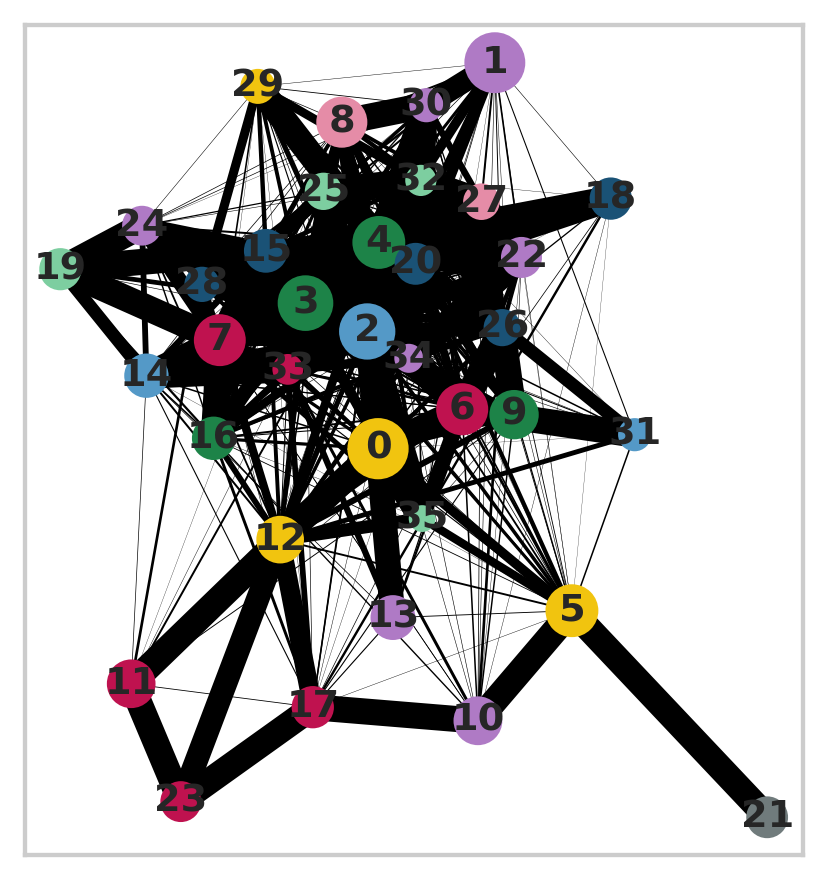

In [ ]:
#Exact values used to generate PAGA image below
# sc.pp.neighbors(bus_fs_clus,n_neighbors=150, n_pcs=60,random_state=42) #use_rep='X_nca'
# sc.tl.paga(bus_fs_clus, groups='cellRanger_louvain',)

sc.pl.paga(bus_fs_clus, color=['cellRanger_louvain'])

In [ ]:
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
# Add fed_neighbor_score to adata
# bus_fs_clus.obs['fed_neighbor_score'] = neighborScores(bus_fs_clus,'True') #Uncomment to run

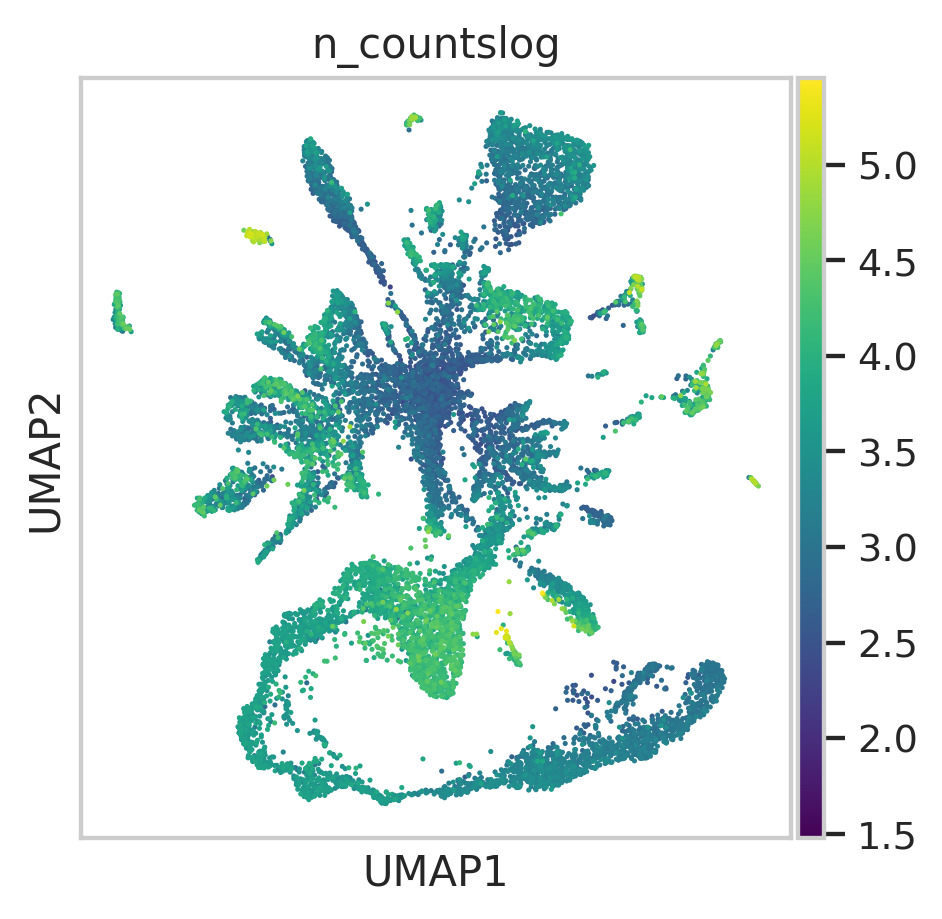

In [ ]:
#Exact parameters for umap embedding below
#sc.tl.umap(bus_fs_clus,random_state=42,spread=2.5,min_dist = 0.8,init_pos='paga') #min_dist=0.5,spread=3,   min_dist=0.3

#sc.pl.umap(bus_fs_clus,color=['annos'])
sc.pl.umap(bus_fs_clus,color=['n_countslog'],color_map='viridis')

In [ ]:
#Change colormap range
rgb_list = [tuple([67/256,114/256,196/256]),tuple([237/256,125/256,49/256])]
float_list = list(np.linspace(0,1,len(rgb_list)))

cdict = dict()
for num, col in enumerate(['red','green','blue']):
  col_list = [[float_list[i],rgb_list[i][num],rgb_list[i][num]] for i in range(len(float_list))]
  cdict[col] = col_list

cmp = mcolors.LinearSegmentedColormap('starv',segmentdata=cdict,N=256)

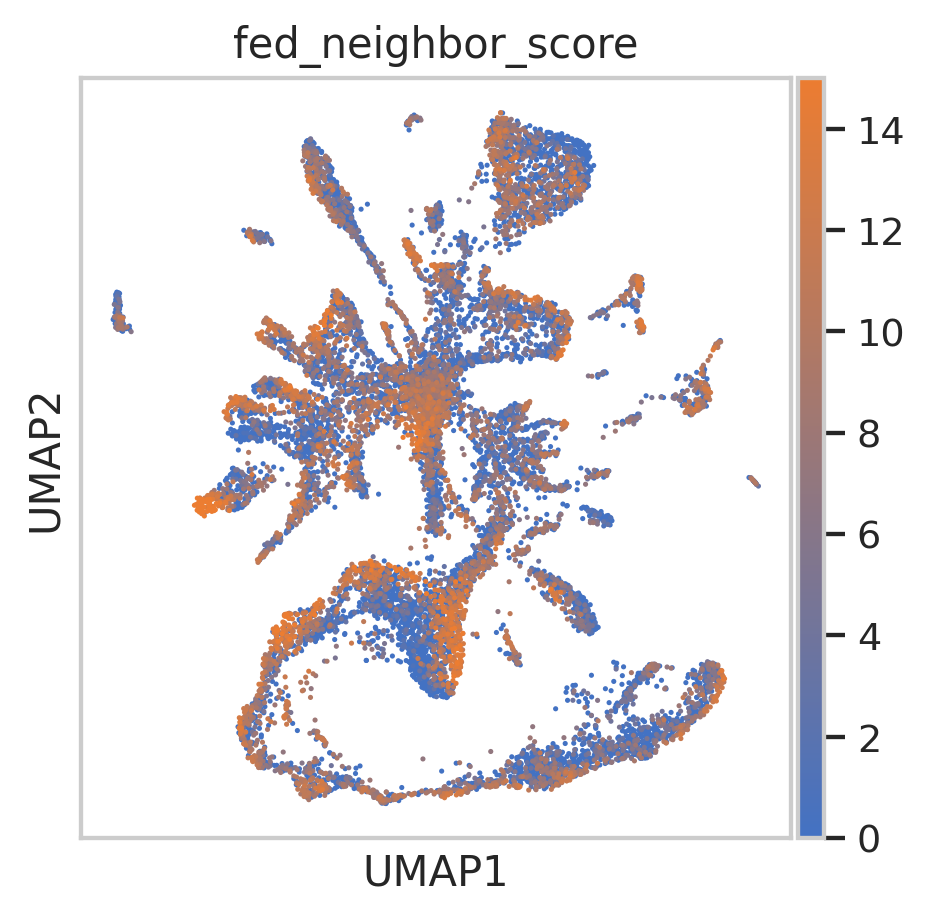

In [ ]:
sc.pl.umap(bus_fs_clus,color=['fed_neighbor_score'],color_map=cmp,save='score.pdf')

In [ ]:
bus_fs_clus.obs['Individual'] = pd.Categorical(bus_fs_clus.obs['orgID'])
bus_fs_clus.obs['Individual'].cat.categories

Index(['1', '2', '3', '4', '5', '6', '7', '8', '9', '10'], dtype='object')

In [ ]:
bus_fs_clus.uns['Individual_colors'] = np.array(['#B00005','#8F5DFD','#FED354',
                                                 '#7D98D3','#FD4F53','#5FA137',
                                                 '#F0A171','#BBD9BB','#D18085',
                                                 '#16A53F'])

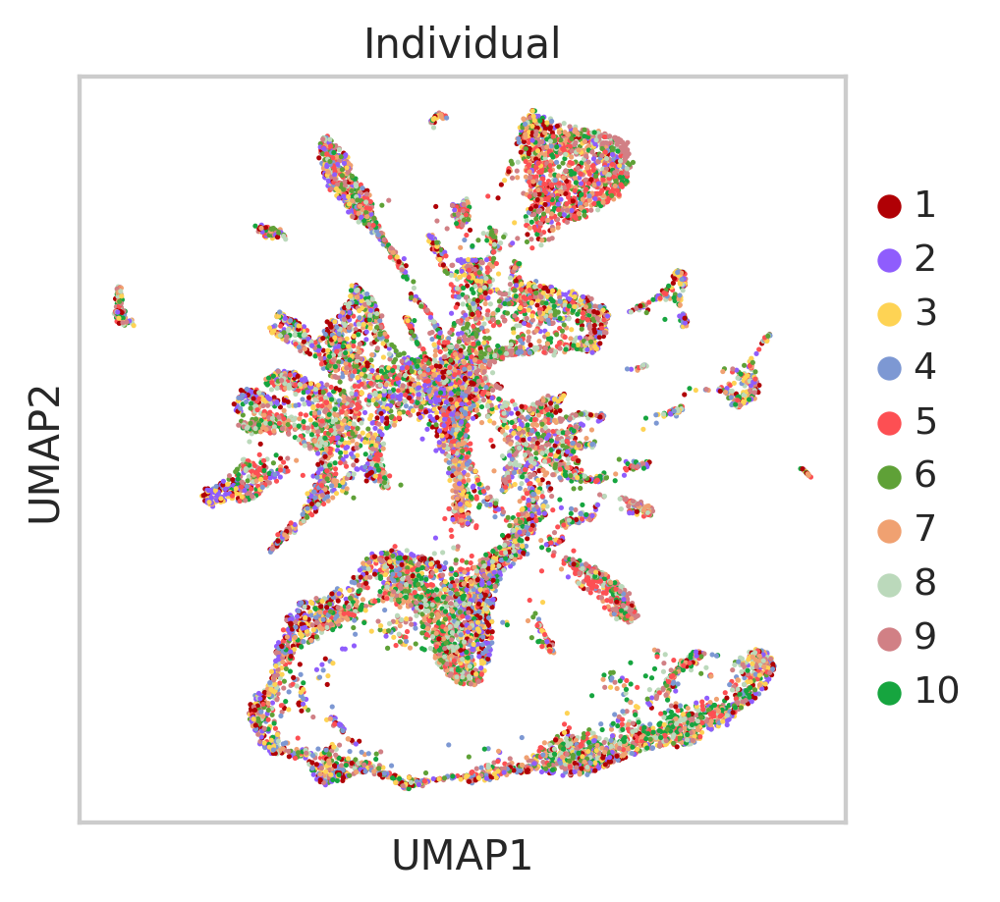

In [ ]:
#Assign color to orgIDs
sc.pl.umap(bus_fs_clus,color=['Individual'],save='orgID.pdf')

####**How Cluster/Cell Type Labels are Assigned**

In [ ]:
#Defining the eight main classes

def annotateLouvain(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35,13,2,0]:
      cluster_types += ['Stem Cell/Germ Cell']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12,11,23,17]:
      cluster_types += ['Nematocyte']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5,10,21]:
      cluster_types += ['Mechanosensory']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6,9,26,31]:
      cluster_types += ['Neural']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34,22,27,32,25]:
      cluster_types += ['Gland Cell']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3,7,14,15,19,24,16,33]:
      cluster_types += ['Gastroderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Bioluminescent Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1,4,29,18,8,30,20]:
      cluster_types += ['Epidermal/Muscle']
    
    
  bus_fs_clus.obs['annos'] = pd.Categorical(cluster_types)

annotateLouvain(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:
bus_fs_clus.obs["annos"].cat.categories

Index(['Bioluminescent Cells', 'Epidermal/Muscle', 'Gastroderm', 'Gland Cell',
       'Mechanosensory', 'Nematocyte', 'Neural', 'Stem Cell/Germ Cell'],
      dtype='object')

In [ ]:
bus_fs_clus.uns['annos_colors'] = ['#707B7C','#AF7AC5','#BF124F','#1A5276','#5499C7','#1D8348','#7DCEA0','#F1C40F']


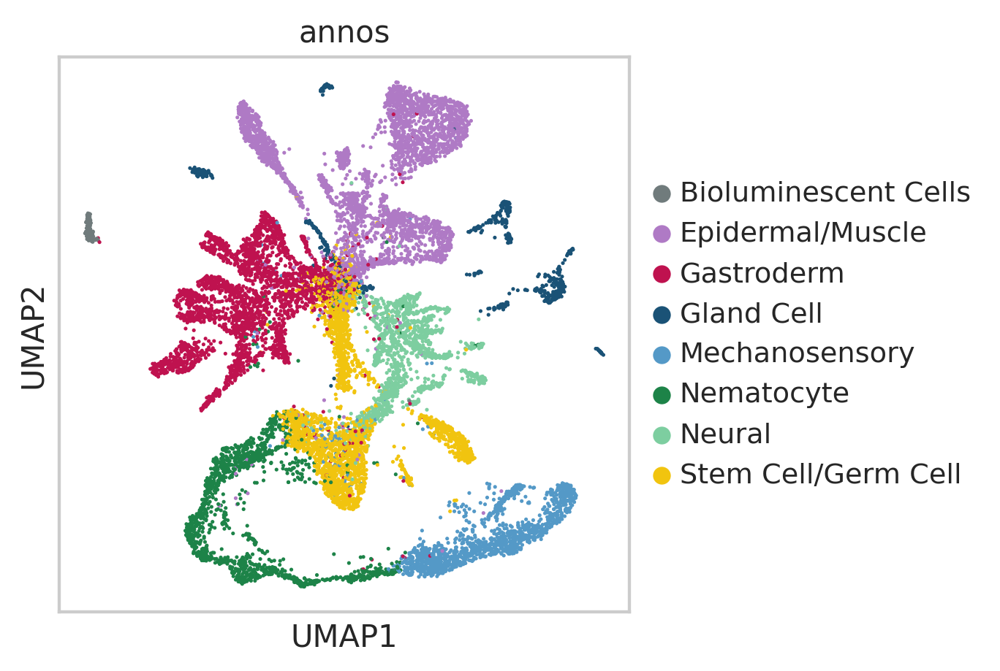

In [ ]:
sc.pl.umap(bus_fs_clus,color="annos")

In [ ]:
#Get colors for broad class annotations, and apply colors to 36 subclusters
colors = bus_fs_clus.uns['annos_colors']
colorsCellR = bus_fs_clus.uns['cellRanger_louvain_colors']

annos_names = bus_fs_clus.obs["annos"].cat.categories
cellR_names = bus_fs_clus.obs["cellRanger_louvain"].cat.categories

annos_dict = {}
annos_dict['Stem Cell/Germ Cell'] = [35,13,2,0]
annos_dict['Nematocyte'] = [12,11,23,17]
annos_dict['Mechanosensory'] = [5,10,21]
annos_dict['Neural'] = [6,9,26,31]
annos_dict['Gland Cell'] = [34,22,27,32,25]
annos_dict['Gastroderm'] = [3,7,14,15,19,24,16,33]
annos_dict['Bioluminescent Cells'] = [28]
annos_dict['Epidermal/Muscle'] = [1,4,29,18,8,30,20]

#annos_dict

In [ ]:
#Update 36 Louvain cluster colors with main class colors
for n in annos_names:
  pos = annos_dict[n]
  for p in pos:
    #
    pos_2 = np.where(annos_names == n)[0][0]
    colorsCellR[p] = colors[pos_2]

#colorsCellR
colorsCopy = colorsCellR.copy()

In [ ]:
#Append color information to adata
bus_fs_clus.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_clus.uns['new_cellRanger_louvain_colors'] = colorsCellR

#Convert labels to string format for plotting - and update order of colors
#Make dictionary with cellRanger_louvain 36 clusters and new names --> new_cellRanger_louvain
bus_fs_clus.obs['new_cellRanger_louvain'] = [str(i) for i in bus_fs_clus.obs['new_cellRanger_louvain']]
bus_fs_clus.obs['new_cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['new_cellRanger_louvain'])

new_cats = bus_fs_clus.obs['new_cellRanger_louvain'].cat.categories

new_colors = bus_fs_clus.uns['new_cellRanger_louvain_colors']
for i in range(0,len(new_cats)):
  new_colors[i] = colorsCopy[int(new_cats[i])]

bus_fs_clus.uns['new_cellRanger_louvain_colors'] = new_colors

#Create dendrogram for subclusters
sc.tl.dendrogram(bus_fs_clus,'new_cellRanger_louvain',linkage_method='ward')


bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_['new_cellRanger_louvain']"]



In [ ]:
bus_fs_clus.uns['new_cellRanger_louvain_colors']

array(['#F1C40F', '#AF7AC5', '#5499C7', '#1D8348', '#1D8348', '#F1C40F',
       '#BF124F', '#BF124F', '#BF124F', '#1D8348', '#AF7AC5', '#BF124F',
       '#F1C40F', '#AF7AC5', '#5499C7', '#1A5276', '#1D8348', '#BF124F',
       '#1A5276', '#7DCEA0', '#1A5276', '#707B7C', '#AF7AC5', '#BF124F',
       '#AF7AC5', '#7DCEA0', '#1A5276', '#BF124F', '#1A5276', '#F1C40F',
       '#AF7AC5', '#5499C7', '#7DCEA0', '#BF124F', '#AF7AC5', '#7DCEA0'],
      dtype=object)

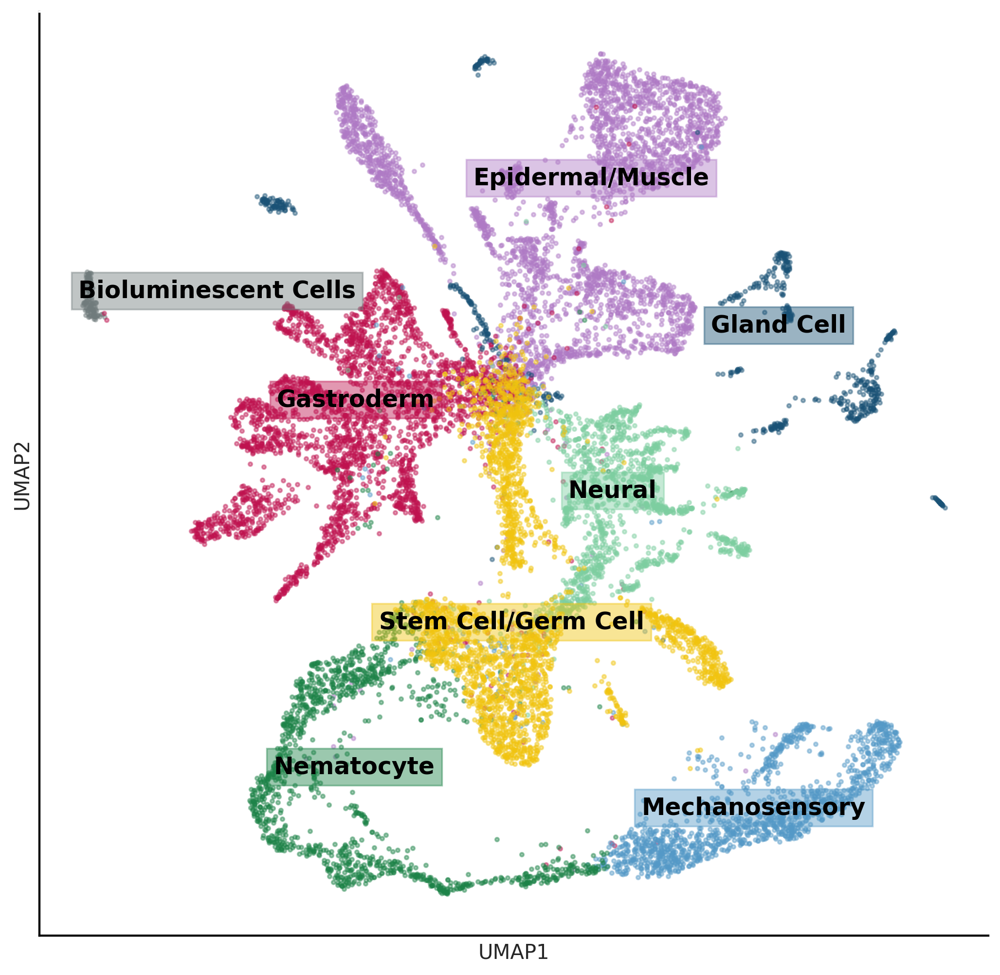

In [ ]:
#Make plot for 8 broad classes of cell types
colors = bus_fs_clus.uns['annos_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["annos"].values)
cmap = [i+'70' for i in colors]#plt.cm.get_cmap("tab20")


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.annos == cluster,:].obsm["X_umap"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=cluster,s=5)
    if name == 'Bioluminescent Cells':
      ax.annotate(name, 
                  (np.median(x)+7, np.median(y)),
                  horizontalalignment='center',
                  verticalalignment='bottom',
                  size=14, weight='bold',
                  color="black",
                  backgroundcolor=cmap[idx])
    else:
      ax.annotate(name, 
                  (np.median(x), np.median(y)),
                  horizontalalignment='center',
                  verticalalignment='bottom',
                  size=14, weight='bold',
                  color="black",
                  backgroundcolor=cmap[idx])
 
ax.set_xlabel('UMAP1')
ax.set_ylabel('UMAP2')
ax.grid(False)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])
for edge_i in ['bottom','left']:
    ax.spines[edge_i].set_edgecolor("black")
for edge_i in ['top', 'right']:
    ax.spines[edge_i].set_edgecolor("white")

plt.savefig('broadAtlas.pdf') 
plt.show()
 

In [11]:
#Names for all 36 clusters/cell types
def annotateLouvainSub(bus_fs_clus):
  cluster_types = []
  
  for i in bus_fs_clus.obs_names:

    if bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [12]:
      cluster_types += ['Nematocyte Precursors']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [17]:
      cluster_types += ['Maturing/mature Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [11]:
      cluster_types += ['Early Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [23]:
      cluster_types += ['Late Nematocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [2]:
      cluster_types += ['Medium Oocytes']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [13]:
      cluster_types += ['Small Oocytes']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [7]:
      cluster_types += ['GastroDigestive-B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [15]:
      cluster_types += ['GastroDigestive-D']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [3]:
      cluster_types += ['GastroDigestive-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [14]:
      cluster_types += ['GastroDigestive-C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [19]:
      cluster_types += ['GastroDigestive-E']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [24]:
      cluster_types += ['GastroDigestive-F']


    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [5]:
      cluster_types += ['Mechanosensory Cells Early Stages']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [10]:
      cluster_types += ['Mechanosensory Cells-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [21]:
      cluster_types += ['Mechanosensory Cells-B']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [0]:
      cluster_types += ['i-Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [1]:
      cluster_types += ['Exumbrella Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [4]:
      cluster_types += ['Manubrium Epidermis']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [6]:
      cluster_types += ['Neural Cells Early Stages']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [9]:
      cluster_types += ['Neural Cells-A (incl. CLWa, MIH cells)']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [26]:
      cluster_types += ['Neural Cells-B (incl. RFamide cells)']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [31]:
      cluster_types += ['Neural Cells-C (incl. YFamide cells)']

    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [8]:
      cluster_types += ['Striated Muscle of Subumbrella']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [16]:
      cluster_types += ['Tentacle Bulb Distal Gastroderm']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [18]:
      cluster_types += ['Radial Smooth Muscles']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [20]:
      cluster_types += ['Tentacle Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [22]:
      cluster_types += ['Gland Cells-A']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [25]:
      cluster_types += ['Gland Cells-C']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [27]:
      cluster_types += ['Gland Cells-B']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [28]:
      cluster_types += ['Tentacle GFP Cells']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [29]:
      cluster_types += ['Gonad Epidermis']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [30]:
      cluster_types += ['Striated Muscle of Velum']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [32]:
      cluster_types += ['Gland Cells-D']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [33]:
      cluster_types += ['Endodermal Plate']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [34]:
      cluster_types += ['Gland Cells-E']
    elif bus_fs_clus[i,:].obs['cellRanger_louvain'][0] in [35]:
      cluster_types += ['Very Early Oocytes']
    
  bus_fs_clus.obs['annosSub'] = pd.Categorical(cluster_types)

annotateLouvainSub(bus_fs_clus)
bus_fs_clus

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

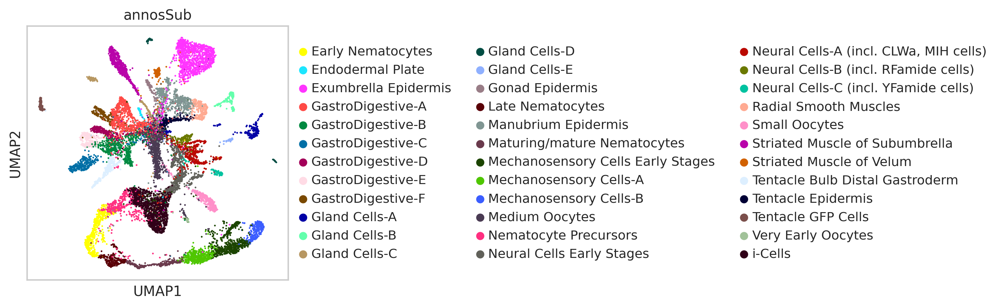

In [12]:
sc.pl.umap(bus_fs_clus,color='annosSub')

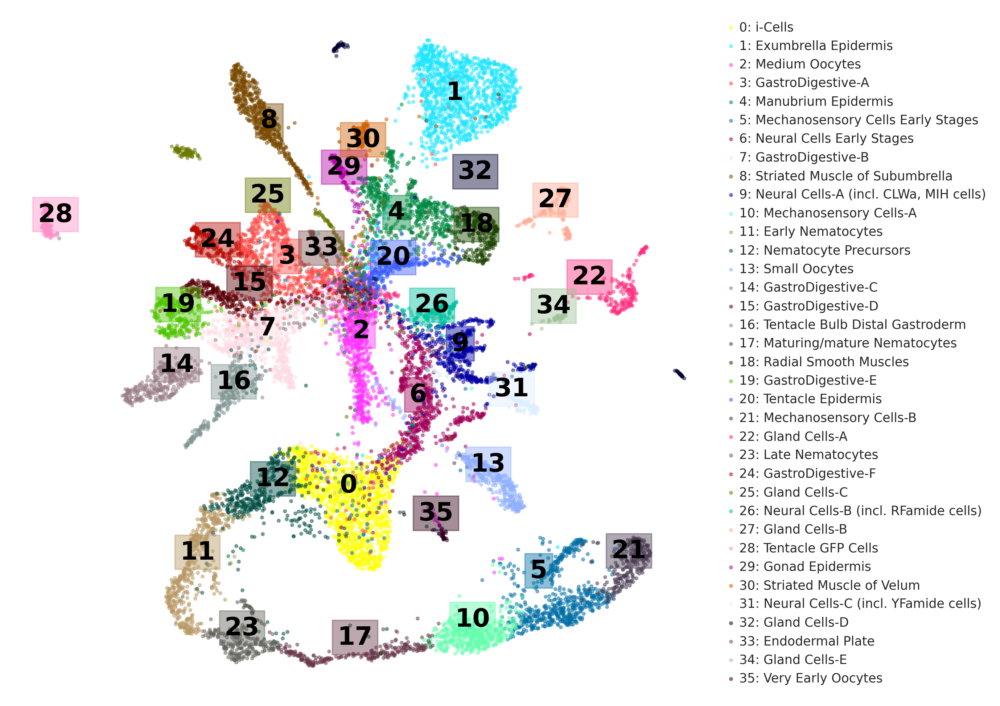

In [13]:
colors = bus_fs_clus.uns['annosSub_colors']
colors
fig, ax = plt.subplots(figsize=(10,10))

c = np.unique(bus_fs_clus.obs["cellRanger_louvain"].values)
cmap = [i+'70' for i in colors]


names = c

for idx, (cluster, name) in enumerate(zip(c, names)):
    XX = bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obsm["X_umap"]
    text = list(bus_fs_clus[bus_fs_clus.obs.cellRanger_louvain.isin([cluster]),:].obs.annosSub)[0]
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap[idx], label=str(cluster)+': '+text,s=5)
    ax.annotate(name, 
             (np.mean(x), np.mean(y)),
             horizontalalignment='center',
             verticalalignment='bottom',
             size=20, weight='bold',
             color="black",
               backgroundcolor=cmap[idx]) 
    

ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 10},frameon=False)
ax.set_axis_off()
#plt.savefig('36ClusAtlas.pdf')  
plt.show()


In [14]:
# This is the saved output used in the notebook
bus_fs_clus.write('fedStarved_withUMAPPaga.h5ad')

#### **Heatmaps for Top Markers**

##### **How marker genes are selected and annotated for the 36 cell types**

In [ ]:
#Get top n marker genes for each cluster

#Keep top 100 genes, 'louvain_neur' is label for neuron clusters determined using Louvain clustering algorithm
sc.tl.rank_genes_groups(bus_fs_clus, 'cellRanger_louvain',n_genes = 100,method='wilcoxon') #Using non-parametric test for significance

In [ ]:
#Make dataframe, with 100 marker genes for each cluster + annotations
clusters = np.unique(bus_fs_clus.obs['cellRanger_louvain'])
markers = pd.DataFrame()

clus = []
markerGene = []
padj = []
orthoGene = []
orthoDescr = []

pantherNum = []
pantherDescr = []

goTerms = []

for i in clusters:
  genes = bus_fs_clus.uns['rank_genes_groups']['names'][str(i)]

  clus += list(np.repeat(i,len(genes)))
  markerGene += list(genes)
  padj += list(bus_fs_clus.uns['rank_genes_groups']['pvals_adj'][str(i)])

  for g in genes:
        
    sub_df = hg_ortho_df[hg_ortho_df.XLOC.isin([g])]
    panth_df = panther_df[panther_df[0].isin([g])]
    go_df = goTerm_df[goTerm_df[0].isin([g])]

    if len(sub_df) > 0:
      #Save first result for gene/description
      orthoGene += [list(sub_df.Gene)[0]]
      orthoDescr += [list(sub_df.Description)[0]]
    else:
      orthoGene += ['NA']
      orthoDescr += ['NA']


    if len(panth_df) > 0:
      pantherNum += [list(panth_df[1])]
      pantherDescr += [list(panth_df[2])]
    else:
      pantherNum += ['NA']
      pantherDescr += ['NA']


    if len(go_df) > 0:
      goTerms += [list(go_df[1])]
    else:
      goTerms += ['NA']
 

markers['clus'] = clus
markers['markerGene'] = markerGene
markers['padj'] = padj

markers['orthoGene'] = orthoGene
markers['orthoDescr'] = orthoDescr

markers['pantherID'] = pantherNum
markers['pantherDescr'] = pantherDescr

markers['goTerms'] = goTerms
     
markers.head()
#list(neurons.uns['rank_genes_groups']['names']['1'])




,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],[PTHR47958:SF10],[ATP-DEPENDENT RNA HELICASE DDX39A],"[GO:0015931,GO:0051169,GO:0006807,GO:0030529,G..."
1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,[PTHR11353:SF22],[T-COMPLEX PROTEIN 1 SUBUNIT ETA],"[GO:0019538,GO:0044238,GO:0006461,GO:0006457,G..."
2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,[PTHR10804:SF11],[PROLIFERATION-ASSOCIATED PROTEIN 2G4],"[GO:0016787,GO:0044238,GO:0008152,GO:0006508,G..."
3,0,XLOC_017967,0.0,NA,NA,NA,NA,[nan]
4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],[PTHR11843:SF19],[40S RIBOSOMAL PROTEIN S12],"[GO:0005737,GO:0005622,GO:0032991,GO:0005840,G..."


In [ ]:
#Write to csv
markers.to_csv('fs_marker_annotations.csv')

#Read in csv (previously saved version, uploaded to Box)
markers = pd.read_csv('fs_marker_annotations.csv',
            sep=",")
markers.head()

,Unnamed: 0,clus,markerGene,padj,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms
0,0,0,XLOC_010813,0.0,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],"['GO:0015931,GO:0051169,GO:0006807,GO:0030529,..."
1,1,0,XLOC_043536,0.0,CCT7,T-complex protein 1 subunit eta isoform a [Ho...,['PTHR11353:SF139'],['T-COMPLEX PROTEIN 1 SUBUNIT ETA'],"['GO:0019538,GO:0044238,GO:0006461,GO:0006457,..."
2,2,0,XLOC_008430,0.0,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']","['GO:0016787,GO:0044238,GO:0008152,GO:0006508,..."
3,3,0,XLOC_017967,0.0,NaN,NaN,NaN,NaN,[nan]
4,4,0,XLOC_000657,0.0,RPS12,40S ribosomal protein S12 [Homo sapiens],['PTHR11843:SF5'],['40S RIBOSOMAL PROTEIN S12'],"['GO:0005737,GO:0005622,GO:0032991,GO:0005840,..."


In [ ]:
topGenes = []
clusts = []
names = []
var_groups = []
var_labels = []

top5 = pd.DataFrame()

ind = 0
n_genes = 5
for j in np.unique(markers.clus):
  sub = markers[markers.clus == j]
  sub.sort_values(by='padj',ascending=True)

  noDups = [i for i in sub.markerGene if i not in topGenes] #Remove duplicate genes
  topGenes += list(noDups[0:n_genes])
  clusts += [j]*n_genes


top5['marker'] = topGenes
top5['clus'] = clusts

top5.to_csv('top5markersAtlas.csv')

  

##### **Read in saved markers for figure**

In [ ]:
#List of top markers for Figure 2, from subset of top5markers
topMarkers = pd.read_csv('D1.1809',sep=",")
topMarkers.head()

,clus,markerGene,annot,orthoGene,orthoDescr,pantherID,pantherDescr,source
0,0,XLOC_010813,DDX39A/B,DDX39B,spliceosome RNA helicase DDX39B [Homo sapiens],['PTHR24031:SF521'],['SPLICEOSOME RNA HELICASE DDX39B'],
1,0,XLOC_008430,PA2G4,PA2G4,proliferation-associated protein 2G4 [Homo sa...,['PTHR10804:SF125'],"['PROLIFERATION-ASSOCIATED 2G4 ,B']",
2,1,XLOC_016073,ZP-containing-1,NaN,NaN,['PTHR11576'],['ZONA PELLUCIDA SPERM-BINDING PROTEIN 3'],
3,2,XLOC_006164,FMN-reductiase,NaN,NaN,['PTHR30543:SF12'],['NAD(P)H-DEPENDENT FMN REDUCTASE LOT6'],
4,3,XLOC_013735,Innexin-like,NaN,NaN,['PTHR11893:SF41'],['INNEXIN INX7'],


In [ ]:
topMarkers = topMarkers[0:51]

In [ ]:
topGenes = []
names = []
var_groups = []
var_labels = []
ind = 0

#Add cell type labels for gene markers
for i in np.unique(topMarkers.clus):
  sub = topMarkers[topMarkers.clus == i]


  topGenes += list(sub.markerGene)
  names += list(sub.annot)

  var_groups += [(ind,ind+len(list(sub.annot))-1)]
  var_labels += [str(int(i))] 
  ind += len(list(sub.annot))

In [ ]:
#Add to raw data so any genes can be plotted
#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("D1.1797")
print(bus_fs_raw )

sc.pp.filter_cells(bus_fs_raw, min_counts=0) #1
sc.pp.filter_genes(bus_fs_raw, min_counts=0)

bus_fs_raw.obs['new_cellRanger_louvain'] = bus_fs_clus.obs['new_cellRanger_louvain']
bus_fs_raw.uns["dendrogram_new_cellRanger_louvain"] = bus_fs_clus.uns["dendrogram_new_cellRanger_louvain"]
bus_fs_raw.uns['new_cellRanger_louvain_colors'] = bus_fs_clus.uns['new_cellRanger_louvain_colors']
bus_fs_raw.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])



AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'


In [ ]:
#Plot data with names attached to gene XLOCs
toPlot = bus_fs_raw[:,topGenes]
toPlot.var['names'] = names

sc.pp.log1p(toPlot)

Trying to set attribute `.var` of view, copying.


In [ ]:
#Subsample for clusters > 100 in size
#Subsample from full dataset, across each cluster
def subSample(adata):
  groups = np.unique(adata.obs['cellRanger_louvain'])
  subSample = 100
  cellNames = np.array(adata.obs_names)

  allCells = []
  for i in groups:
      
      cells = np.array(list(adata.obs['cellRanger_louvain'].isin([i])))
      cellLocs = list(np.where(cells)[0])
      
      if len(cellLocs) > 100:
      #Take all cells if < subSample
        choice = random.sample(cellLocs,subSample)
      else:
        choice = cellLocs
     
      pos = list(choice)
      #print(len(pos))
      
      allCells += list(cellNames[pos])

      
  sub = adata[allCells,:]
  return sub


In [ ]:
toPlotSub = subSample(toPlot)
toPlotSub

View of AnnData object with n_obs × n_vars = 3404 × 51
    obs: 'batch', 'n_counts', 'new_cellRanger_louvain', 'fed', 'cellRanger_louvain'
    var: 'n_counts', 'names'
    uns: 'dendrogram_new_cellRanger_louvain', 'new_cellRanger_louvain_colors', 'log1p'

In [ ]:
bus_fs_raw.uns['new_cellRanger_louvain_colors']

array(['#F1C40F', '#AF7AC5', '#5499C7', '#1D8348', '#1D8348', '#F1C40F',
       '#BF124F', '#BF124F', '#BF124F', '#1D8348', '#AF7AC5', '#BF124F',
       '#F1C40F', '#AF7AC5', '#5499C7', '#1A5276', '#1D8348', '#BF124F',
       '#1A5276', '#7DCEA0', '#1A5276', '#707B7C', '#AF7AC5', '#BF124F',
       '#AF7AC5', '#7DCEA0', '#1A5276', '#BF124F', '#1A5276', '#F1C40F',
       '#AF7AC5', '#5499C7', '#7DCEA0', '#BF124F', '#AF7AC5', '#7DCEA0'],
      dtype=object)

In [ ]:
sc.set_figure_params(scanpy=True, fontsize=30,dpi=150)
#bus_fs_clus.obs['cellRanger_louvain'] =  pd.Categorical([str(i) for i in bus_fs_clus.obs['cellRanger_louvain']])
sc.pl.heatmap(toPlotSub, names, groupby='new_cellRanger_louvain', dendrogram=True,show_gene_labels=True,
              var_group_positions=var_groups,var_group_labels=var_labels,cmap='PuBuGn',gene_symbols='names',
              standard_scale='var',use_raw=False,swap_axes=True,figsize = (30,30),save='cellAtlas.pdf')

####**DE Gene Analysis Across Clusters (After Extracting Perturbed Genes)**

In [ ]:
#Remove clusters with < 10 cells per condition

#Read in previously saved data
bus_fs_clus = anndata.read("D1.1796")
print(bus_fs_clus )

bus_fs_raw = anndata.read("D1.1797")

bus_fs_raw = bus_fs_raw[bus_fs_clus.obs_names,]
#bus_fs_raw.obs['orgID'] = bus_fs_clus.obs['orgID']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw


#clusSize

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'fed', 'cellRanger_louvain'

##### **Cluster DE Genes by Expression and Run TopGO Analysis**

Use output from DeSeq2 analysis in separate notebook: Genes in each cell type with differential expression under starvation

In [ ]:
deGenesDF = pd.read_csv('D1.1810') #deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv from DeSeq2 analysis
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4
1,1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4
2,2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0
3,3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1
4,4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4


In [ ]:
deGenesDF_sig = deGenesDF[deGenesDF.padjClus < 0.05]

Cluster gene x cell matrix for 'perturbed' genes

In [ ]:
#Filter raw count dataset for only perturbed genes
bus_fs_raw = anndata.read("D1.1797")
bus_fs_raw = bus_fs_raw [:,np.unique(deGenesDF_sig.Genes)]
bus_fs_raw =bus_fs_raw[bus_fs_clus.obs_names,:]
bus_fs_raw.obs['cellRanger_louvain'] = bus_fs_clus.obs['cellRanger_louvain']
bus_fs_raw.obs['fed'] = bus_fs_clus.obs['fed']

Trying to set attribute `.obs` of view, copying.


In [ ]:
de_gene_adata = anndata.AnnData(X=bus_fs_raw.X.T)
de_gene_adata.var_names = bus_fs_raw.obs_names
de_gene_adata.obs_names = bus_fs_raw.var_names

de_gene_adata_orig = de_gene_adata.copy()
#de_gene_adata

numIntersects = deGenesDF['Genes'].value_counts()
num_intersect = []
for g in de_gene_adata.obs_names: 
    if g in list(deGenesDF['Genes']):
      num_intersect += [numIntersects[g]]
    else:
      num_intersect += [0]
    
de_gene_adata.obs['numIntersects'] = pd.Categorical(num_intersect)

#de_gene_adata

de_gene_adata

AnnData object with n_obs × n_vars = 953 × 13673
    obs: 'numIntersects'

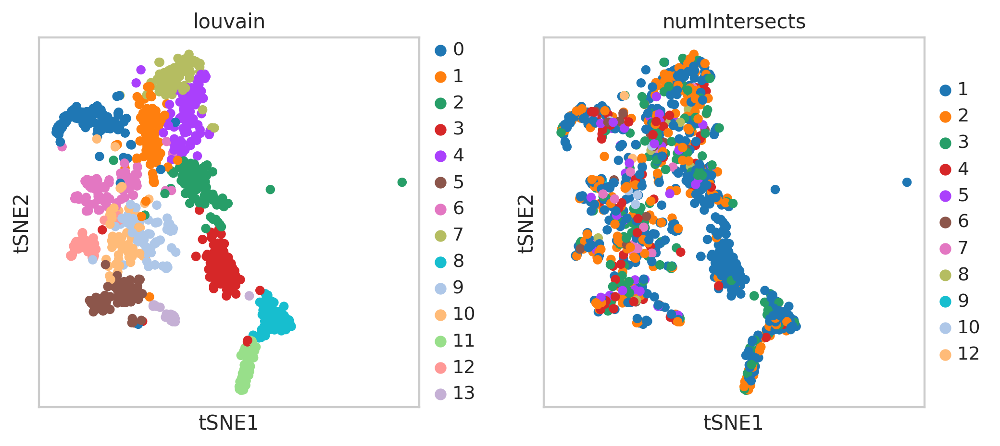

In [ ]:
#Normalize and scale data
sc.pp.filter_genes(de_gene_adata, min_counts=0)

sc.pp.normalize_per_cell(de_gene_adata, counts_per_cell_after=1e4)
de_gene_adata.raw = sc.pp.log1p(de_gene_adata, copy=True)

sc.pp.scale(de_gene_adata, max_value=10)
sc.tl.pca(de_gene_adata, n_comps=60,random_state=42)
#sc.pl.pca_variance_ratio(bus_combo, log=True)

#Determine neighbors for clustering
sc.pp.neighbors(de_gene_adata,n_neighbors=20, n_pcs=15) #n_neighbors=5, n_pcs=15,  20, n_pcs=15
sc.tl.louvain(de_gene_adata,resolution=2)

sc.tl.tsne(de_gene_adata, n_pcs=15,random_state=42)
sc.pl.tsne(de_gene_adata,color=['louvain','numIntersects'])



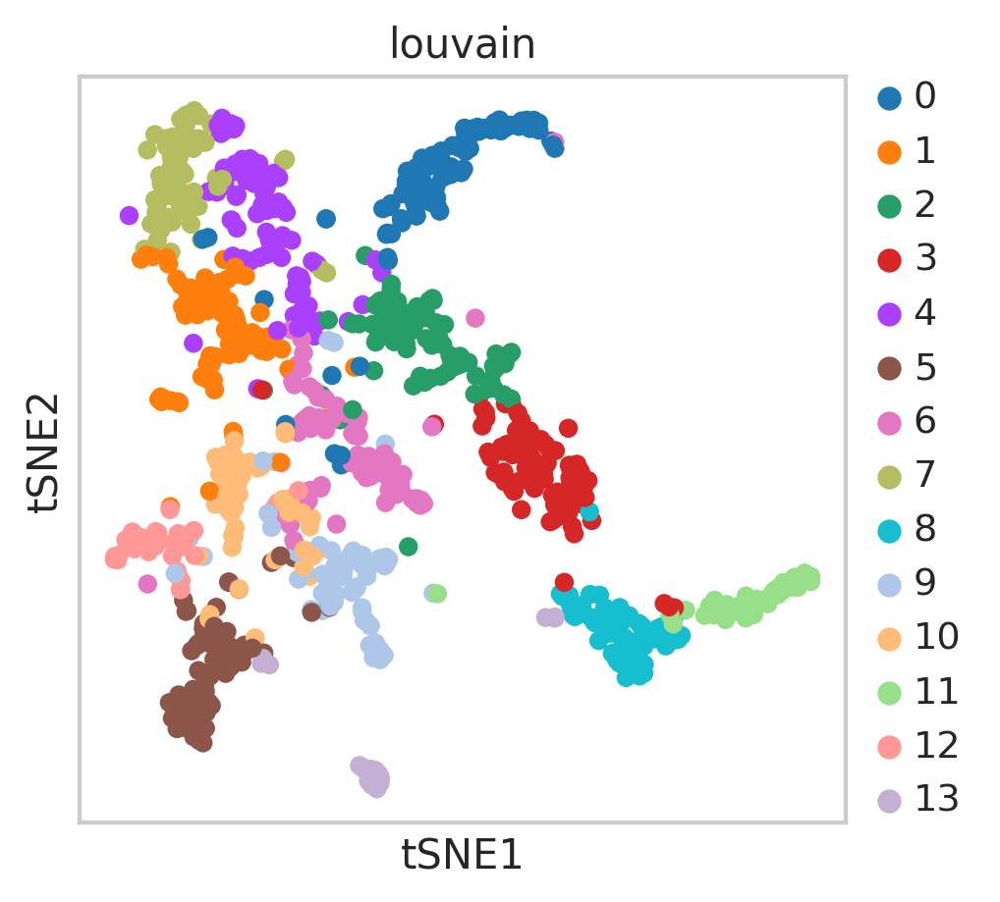

In [ ]:
sc.tl.tsne(de_gene_adata, n_pcs=10,random_state=42,perplexity=15) #
sc.pl.tsne(de_gene_adata,color=['louvain'])

In [ ]:
# Add which gene modules the pertubed genes are in
clusters = []
for g in deGenesDF.Genes:
  if g in list(de_gene_adata.obs_names):
    clus = de_gene_adata[g,:].obs['louvain'][0]
    clusters += [clus]
  else:
    clusters += ['padjClus_not_sig']

deGenesDF['geneClus'] = clusters
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4
1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4
2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0
3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1
4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4


In [ ]:
deGenesDF.to_csv('atlas_deSeq2_deGenesDF_log2FCof1_singleCellReplicates_noShrinkage_subSample_annotations.csv')

In [ ]:
deGenesDF = pd.read_csv('D1.1810') 
deGenesDF.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus
0,0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4
1,1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4
2,2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0
3,3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1
4,4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4


Run TopGO analysis for gene modules to find GO Term enrichment

In [ ]:
#For topGO analysis (To Assign Labels to Modules)

def returnVal(i):
  if i == i:
    i= i.replace("[","")
    i = i.replace("]","")
    i= i.replace("'","")
    i = i.replace("'","")
    return i 
  else:
    return 'nan'

deGenesDF.goTerms = [returnVal(i) for i in list(deGenesDF.goTerms)]
deGenesDF = deGenesDF[deGenesDF.goTerms != 'nan']
deGenesDF = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

deGenesDF.to_csv('atlas_deseq2_genes_fortopGO_metadata.txt',sep='\t',columns=['Genes','goTerms','geneClus'],
             header=None,index_label=False,index=False)
deGenesDF.to_csv('atlas_deseq2_genes_fortopGO.txt',sep='\t',columns=['Genes','goTerms'],
             header=None,index_label=False,index=False)

In [ ]:
%%R 

install.packages('rlang')
if (!requireNamespace("BiocManager", quietly=TRUE)){
  install.packages("BiocManager")
}

BiocManager::install("topGO")


In [ ]:
%%R

library(topGO)
library(readr)
#Read in DE genes (XLOC's) with GO Terms
geneID2GO <- readMappings(file = "atlas_deseq2_genes_fortopGO.txt")
str(head(geneID2GO ))

#Add gene modules as factor 
atlas_deseq2_genes_fortopGO_metadata <- read_delim("atlas_deseq2_genes_fortopGO_metadata.txt", 
                                                   "\t", escape_double = FALSE, col_names = FALSE, 
                                                   trim_ws = TRUE)

#Set variables
allMods = unique(atlas_deseq2_genes_fortopGO_metadata$X3)
alpha = 0.05/length(allMods) #Bonferroni correction, could correct for all pairwise comparisons?


getEnrichTerms <- function(geneID2GO, modMetadata, clus){
  mods <- factor(as.integer(modMetadata$X3 == clus)) #Choose gene module to make 'interesting'
  names(mods) <- names(geneID2GO)

  
  #Get genes only in module of interest
  clusGenes <- function(mods) {
    return(mods == 1)
  }
  subMods <- clusGenes(mods)
  
  #Make GO data
  GOdata <- new("topGOdata", ontology = "BP", allGenes = mods,
                geneSel = subMods, annot = annFUN.gene2GO, gene2GO = geneID2GO)
  
  #GOdata
  #sigGenes(GOdata)
  
  resultFis <- runTest(GOdata, algorithm = "classic", statistic = "fisher")
  
  resultWeight <- runTest(GOdata, statistic = "fisher")

  #P-values from Weight Algorithm
  pvalsWeight <- score(resultWeight)
  
  #hist(pvalsWeight, 50, xlab = "p-values")
  
  allRes <- GenTable(GOdata, classic = resultFis, weight = resultWeight, 
                     orderBy = "weight", ranksOf = "classic", topNodes = 20)
  
  subRes <- allRes[as.numeric(allRes$weight) < alpha,]
  
  #Write output
  write.csv(subRes,file=paste('mod',clus,'_GOTerms.csv',sep=""))
}

#Run for all modules and write outputs
for(c in allMods){
  
  getEnrichTerms(geneID2GO = geneID2GO,modMetadata = atlas_deseq2_genes_fortopGO_metadata, clus = c)
  
}

List of 6
 $ XLOC_007052: chr [1:5] "GO:0019538" "GO:0044238" "GO:0006461" "GO:0006457" ...
 $ XLOC_045583: chr [1:17] "GO:0005488" "GO:0006139" "GO:0007166" "GO:0044238" ...
 $ XLOC_004670: chr [1:12] "GO:0016070" "GO:0006139" "GO:0044238" "GO:0019219" ...
 $ XLOC_025064: chr [1:3] "GO:0003824" "GO:0008152" "GO:0016491"
 $ XLOC_045734: chr [1:16] "GO:0016070" "GO:0016787" "GO:0016072" "GO:0044238" ...
 $ XLOC_042552: chr [1:31] "GO:0019220" "GO:0005085" "GO:0006807" "GO:0007165" ...


R[write to console]: 
── Column specification ────────────────────────────────────────────────────────
cols(
  X1 = col_character(),
  X2 = col_character(),
  X3 = col_double()
)


R[write to console]: 
Building most specific GOs .....

R[write to console]: 	( 176 GO terms found. )

R[write to console]: 
Build GO DAG topology ..........

R[write to console]: 	( 442 GO terms and 780 relations. )

R[write to console]: 
Annotating nodes ...............

R[write to console]: 	( 440 genes annotated to the GO terms. )

R[write to console]: 
			 -- Classic Algorithm -- 

		 the algorithm is scoring 193 nontrivial nodes
		 parameters: 
			 test statistic: fisher

R[write to console]: 
			 -- Weight01 Algorithm -- 

		 the algorithm is scoring 193 nontrivial nodes
		 parameters: 
			 test statistic: fisher

R[write to console]: 
	 Level 12:	4 nodes to be scored	(0 eliminated genes)

R[write to console]: 
	 Level 11:	5 nodes to be scored	(0 eliminated genes)

R[write to console]: 
	 Level 10:	5 

##### **DE Genes Across Cell Types**

We analyze clustered perturbed genes with GO term analysis output by looking at the sharing of gene modules between cell types and differential expression of these genes under starvation

In [ ]:
deGenesDF = pd.read_csv('D1.1810')
deGenesDF.head()

#Read in saved de_gene_adata here
de_gene_adata = anndata.read('D1.1813')
de_gene_adata

AnnData object with n_obs × n_vars = 953 × 13673
    obs: 'numIntersects', 'n_counts', 'louvain', 'clus35', 'clus14', 'clus19'
    var: 'n_counts', 'mean', 'std'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'numIntersects_colors', 'pca'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

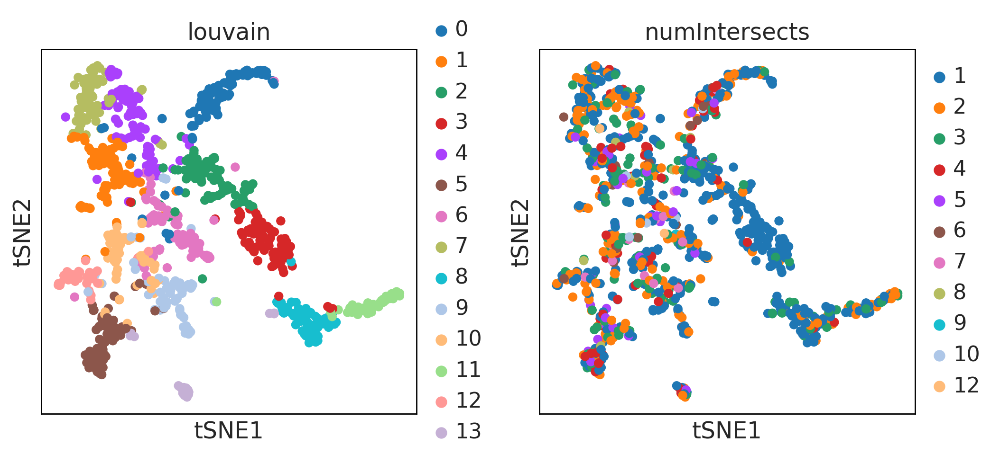

In [ ]:
sc.set_figure_params(dpi=125)
sc.pl.tsne(de_gene_adata,color=['louvain','numIntersects'])

In [ ]:
#Based on saved topGO output (See script....)
c = np.unique(de_gene_adata.obs["louvain"].values)
print(c)

['0' '1' '10' '11' '12' '13' '2' '3' '4' '5' '6' '7' '8' '9']


In [ ]:
names = ['Protein Synthesis & Stress Response','Oxidative Phosphorylation','Cytoskeletal','Synaptic Transmission & Transport','NA','NA',
         'Phosphate-Containing Metabolic Process','Cell Cycle & Development (Early Oocytes)','Protein Synthesis',
         'Proteolysis & Cell Physiology','Cell Cycle','Protein Synthesis & Transport','Cell-Matrix Adhesion','Metabolic Process']

geneClusNames = dict(zip(c, names)) 

In [ ]:
addNames = []
deGenesDF_sig = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']

for i in deGenesDF_sig.geneClus:
  addNames += [geneClusNames[i]]

deGenesDF_sig['names'] = addNames
deGenesDF_sig.head()

,Unnamed: 0,Unnamed: 0.1,Unnamed: 0.1.1,Genes,Cluster,Condition,padj,padjClus,log2FC,orthoGene,orthoDescr,pantherID,pantherDescr,goTerms,geneClus,names
0,0,0,1,XLOC_028699,0,Starved,5.554489e-16,1.832981e-14,-1.284301,NaN,NaN,NaN,NaN,NaN,4,Protein Synthesis
1,1,1,2,XLOC_010635,0,Starved,2.528288e-14,8.343350e-13,-1.492625,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4,Protein Synthesis
2,2,2,3,XLOC_011294,0,Starved,8.348790e-14,2.755101e-12,-1.441413,NaN,NaN,NaN,NaN,[nan],0,Protein Synthesis & Stress Response
3,3,3,4,XLOC_034889,0,Starved,1.786565e-13,5.895663e-12,-1.448216,NaN,NaN,['PTHR13680:SF29'],['CDGSH IRON-SULFUR DOMAIN-CONTAINING PROTEIN ...,[nan],1,Oxidative Phosphorylation
4,4,4,5,XLOC_030861,0,Starved,8.598653e-12,2.837556e-10,-1.570453,SRSF1,serine/arginine-rich splicing factor 1 isofor...,['PTHR24012:SF650'],['SERINE/ARGININE-RICH SPLICING FACTOR 1'],[nan],4,Protein Synthesis


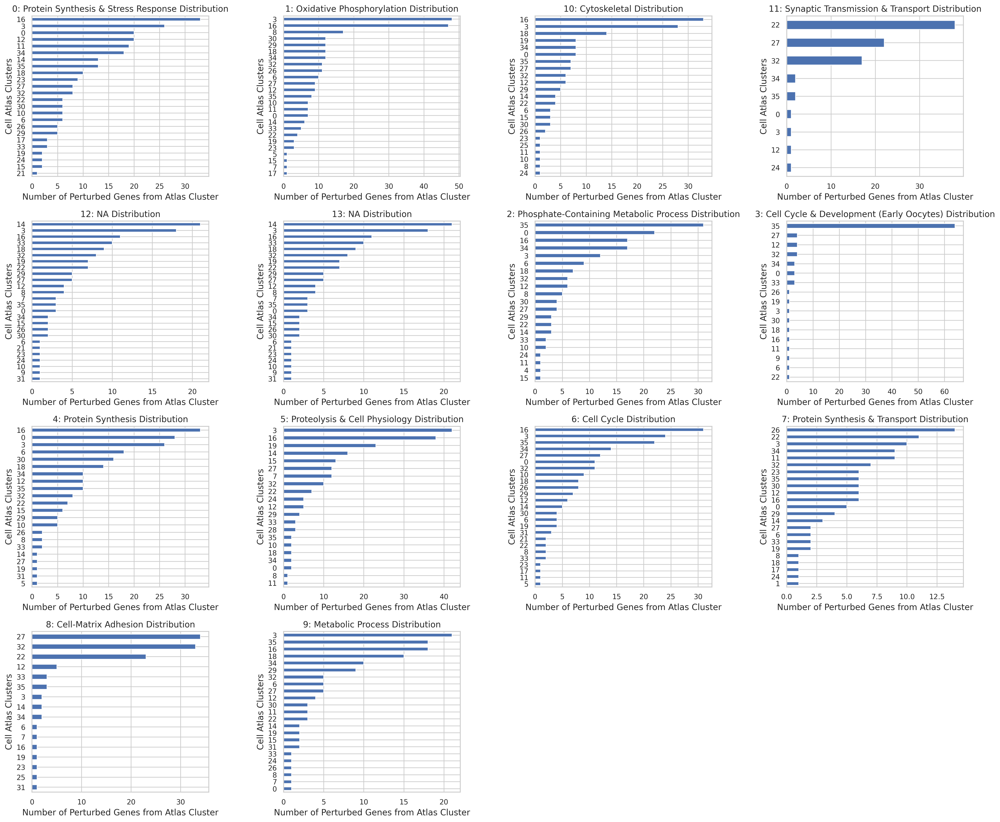

In [ ]:
#https://stackoverflow.com/questions/29530355/plotting-multiple-histograms-in-grid

def draw_plots(df, variables, n_rows, n_cols):
    fig=plt.figure(figsize=(20,20))
    for i, var_name in enumerate(variables):
        ax=fig.add_subplot(n_rows,n_cols,i+1)
        name = geneClusNames[var_name]
        sub = df[df['names'] == name]
        sub.Cluster.value_counts().sort_values().plot(kind = 'barh',ax=ax,fontsize = 10)
        #sub['Cluster'].hist(bins=10,ax=ax)
        ax.set_title(var_name+': '+name+" Distribution",fontsize = 12)
        ax.set_ylabel("Cell Atlas Clusters",fontsize = 12)
        ax.set_xlabel("Number of Perturbed Genes from Atlas Cluster",fontsize = 12)
    fig.tight_layout()  # Improves appearance a bit.

    plt.show()

draw_plots(deGenesDF_sig, np.unique(deGenesDF_sig.geneClus), 5, 4)


###### **Gene Module Plots**

Plot gene modules colored by how genes are shared between cell types

In [ ]:
#Mark DE/Perturbed Genes
def returnDE(i,names):
  if i in list(names):
    return 'DE'
  else:
    return 'nonSig'



In [ ]:
#Mark genes with no GO Terms
def returnVal(i):
  if i == i:
    i= i.replace("[","")
    i = i.replace("]","")
    i= i.replace("'","")
    i = i.replace("'","")
    return i 
  else:
    return 'nan'

def returnGO(i,names):
  if i in names:
    return "withGO"
  else:
    return "n/a"

deGenesDF.goTerms = [returnVal(i) for i in list(deGenesDF.goTerms)]

deGenesDF_sub = deGenesDF[deGenesDF.geneClus != 'padjClus_not_sig']
deGenesDF_sub = deGenesDF_sub[deGenesDF_sub.goTerms != 'nan'] # Has GO Term
withGO_names = list(deGenesDF_sub.Genes)

print(len(np.unique(withGO_names)))

goLabels = [returnGO(i,withGO_names) for i in de_gene_adata.obs_names]
de_gene_adata.obs['withGO'] = pd.Categorical(goLabels)
de_gene_adata

472


AnnData object with n_obs × n_vars = 953 × 13673
    obs: 'numIntersects', 'n_counts', 'louvain', 'clus35', 'clus14', 'clus19', 'withGO'
    var: 'n_counts', 'mean', 'std'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'numIntersects_colors', 'pca'
    obsm: 'X_pca', 'X_tsne'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

In [ ]:

clus14Genes = deGenesDF[deGenesDF.Cluster == 14]
clus19Genes = deGenesDF[deGenesDF.Cluster == 19]
clus35Genes = deGenesDF[deGenesDF.Cluster == 35]

In [ ]:
# Label DE/notDE genes
clus35Labels = [returnDE(i,np.unique(clus35Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus35'] = pd.Categorical(clus35Labels)

clus14Labels = [returnDE(i,np.unique(clus14Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus14'] = pd.Categorical(clus14Labels)

#sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus14'])

In [ ]:
# Label DE/notDE genes
clus19Labels = [returnDE(i,np.unique(clus19Genes.Genes)) for i in de_gene_adata.obs_names]
de_gene_adata.obs['clus19'] = pd.Categorical(clus19Labels)

#sc.pl.tsne(de_gene_adata,groups=['DE'],color=['clus19'])

In [ ]:
c = list(np.unique(de_gene_adata.obs["louvain"].values))
c

['0', '1', '10', '11', '12', '13', '2', '3', '4', '5', '6', '7', '8', '9']

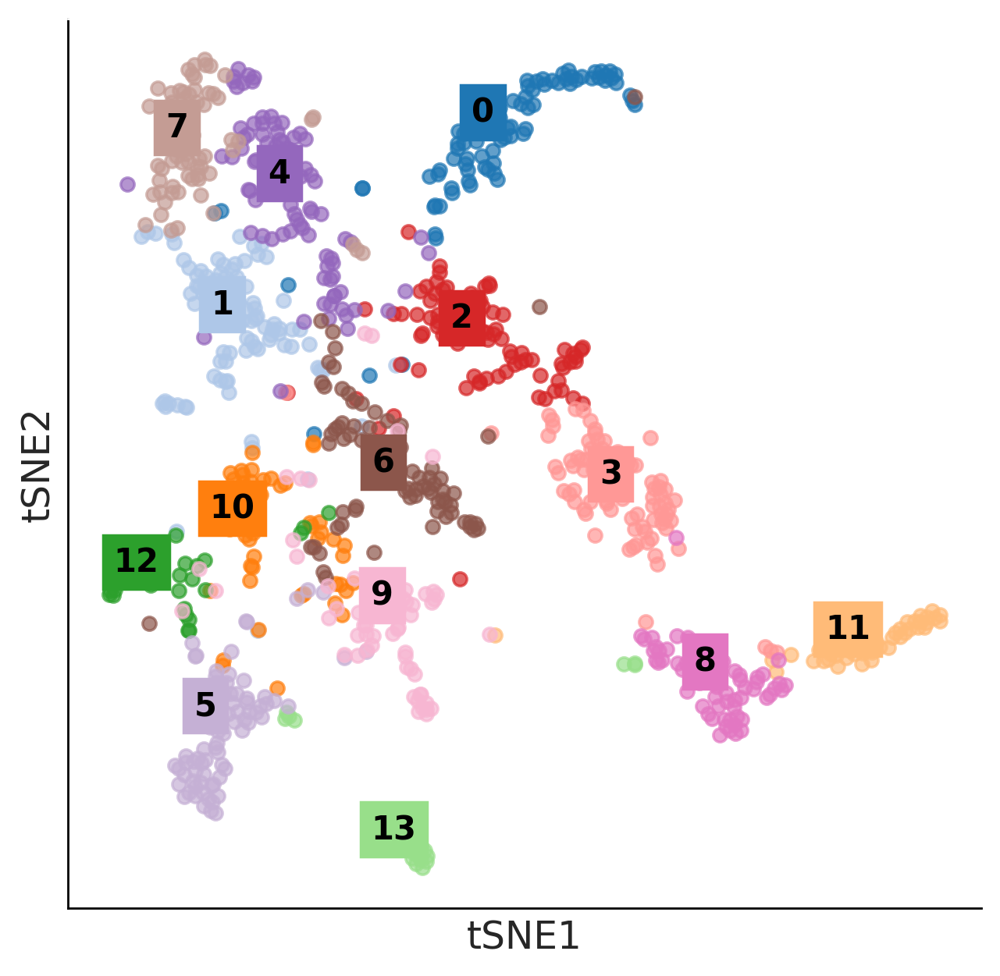

In [ ]:
#Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
fig, ax = plt.subplots(figsize=(6,6))

#c = np.unique(de_gene_adata.obs["louvain"].values)
cmap = plt.cm.get_cmap("tab20")


for idx, (cluster, cluster) in enumerate(zip(c, c)):
    XX = de_gene_adata[de_gene_adata.obs.louvain == cluster,:].obsm["X_tsne"]
    
    x = XX[:,0]
    y = XX[:,1]
    ax.scatter(x, y, color = cmap(idx), label=cluster,s=25,alpha=0.7)

   
    ax.annotate(cluster, 
                (np.median(x), np.median(y)),
                horizontalalignment='right',
                verticalalignment='bottom',
                size=12, weight='bold',
                color="black",
                backgroundcolor=cmap(idx) )
   
    

#ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
#ax.set_axis_off()
ax.set_xlabel('tSNE1')
ax.set_ylabel('tSNE2')
ax.grid(False)
ax.get_xaxis().set_ticks([])
ax.get_yaxis().set_ticks([])
for edge_i in ['bottom','left']:
    ax.spines[edge_i].set_edgecolor("black")
for edge_i in ['top', 'right']:
    ax.spines[edge_i].set_edgecolor("white")
plt.show()

In [ ]:
# Density plot of perturbed genes with two cell types
def multDensityofDE(de_gene_adata,clusName1,clusName2,label1,label2):
  s = 13
  # Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
  fig, ax = plt.subplots(figsize=(3,3))

  XX = de_gene_adata.obsm["X_tsne"]
  
  de1 = np.array([de_gene_adata.obs[clusName1] == 'DE'])
  de2 = np.array([de_gene_adata.obs[clusName2] == 'DE'])

  overlap = list(np.where(de1 & de2)[1])
  only1 = [i for i in list(np.where(de1)[1]) if i not in overlap]
  only2 = [i for i in list(np.where(de2)[1]) if i not in overlap]

  nonsig = [i for i in range(0,len(XX[:,0])) if i not in overlap+only1+only2]
      

  x = XX[nonsig,0]
  y = XX[nonsig,1]
  ax.scatter(x, y, color = 'grey',s=25,alpha=0.1,edgecolors='none') #cmap(idx),label=cluster

  x_DE1 = XX[only1,0]
  y_DE1 = XX[only1,1]
  ax.scatter(x_DE1, y_DE1, color = 'navy',s=25,alpha=0.3,label=label1) #label=cluster

  x_DE2 = XX[only2,0]
  y_DE2 = XX[only2,1]
  ax.scatter(x_DE2, y_DE2, color = 'orange',s=25,alpha=0.3,label=label2) #label=cluster

  x_DE3 = XX[overlap,0]
  y_DE3 = XX[overlap,1]
  ax.scatter(x_DE3, y_DE3, color = 'green',s=25,alpha=0.3,label='Both') #label=cluster

  ax.set_axis_off()
  ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
  plt.show()

# Density plot of perturbed genes with three cell types
def tripleDensityofDE(de_gene_adata,clusName1,clusName2,clusName3,label1,label2):
  s = 13
  # Add labels to each cluster in de_gene_adata (from GO terms) on tSNE plot
  fig, ax = plt.subplots(figsize=(3,3))

  XX = de_gene_adata.obsm["X_tsne"]
  
  de1 = np.array([de_gene_adata.obs[clusName1] == 'DE'])
  de2 = np.array([de_gene_adata.obs[clusName2] == 'DE'])
  de3 = np.array([de_gene_adata.obs[clusName3] == 'DE'])

  overlap = list(np.where((de1 & de2) | (de1 & de3))[1])
  only1 = [i for i in list(np.where(de1)[1]) if i not in overlap]
  other = [i for i in list(np.where(de2 | de3)[1]) if i not in overlap]
 

  nonsig = [i for i in range(0,len(XX[:,0])) if i not in overlap+only1+other]
      

  x = XX[nonsig,0]
  y = XX[nonsig,1]
  ax.scatter(x, y, color = 'grey',s=25,alpha=0.1,edgecolors='none') #cmap(idx),label=cluster

  x_DE1 = XX[only1,0]
  y_DE1 = XX[only1,1]
  ax.scatter(x_DE1, y_DE1, color = 'purple',s=25,alpha=0.3,label=label1) #label=cluster

  x_DE2 = XX[other,0]
  y_DE2 = XX[other,1]
  ax.scatter(x_DE2, y_DE2, color = 'lightcoral',s=25,alpha=0.3,label=label2) #label=cluster

  x_DE3 = XX[overlap,0]
  y_DE3 = XX[overlap,1]
  ax.scatter(x_DE3, y_DE3, color = 'green',s=25,alpha=0.3,label='Shared') #label=cluster

  ax.set_axis_off()
  ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
  plt.show()

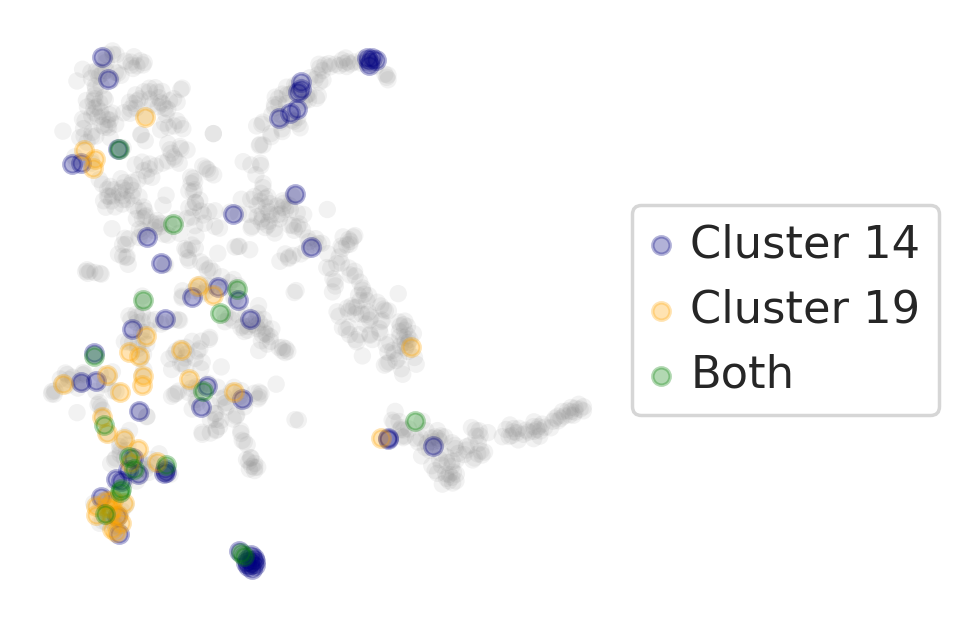

In [ ]:
multDensityofDE(de_gene_adata,'clus14','clus19','Cluster 14','Cluster 19')

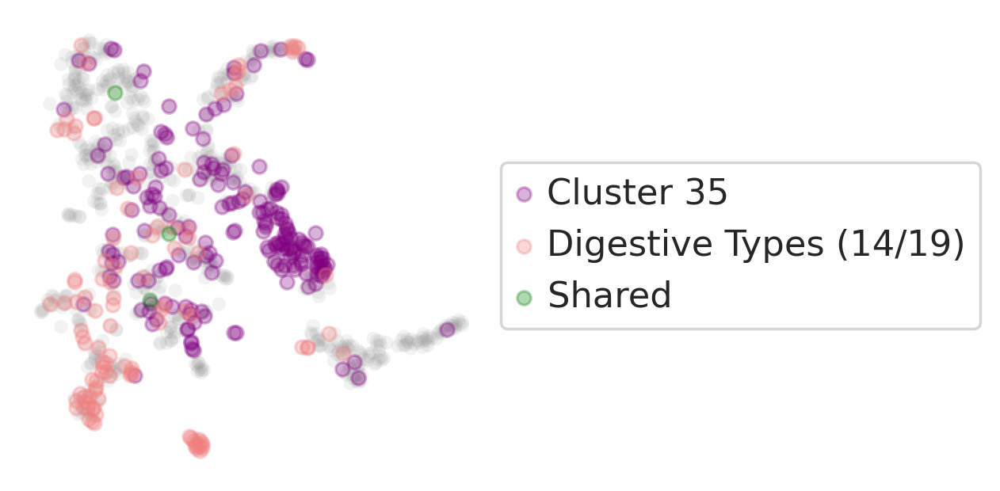

In [ ]:
tripleDensityofDE(de_gene_adata,'clus35','clus14','clus19','Cluster 35','Digestive Types (14/19)')

In [ ]:
#Saved version used for this analysis
#de_gene_adata.write('de_gene_clus_adata.h5ad')

###### **For Gene Cluster SplitsTree Conversion**

In [ ]:
from sklearn.metrics import pairwise_distances

#Centroids of cell atlas/defined clusters
def getClusCentroids(overlap_combo,pcs=60,clusType='knn_clus'):
    clusters = np.unique(overlap_combo.obs[clusType])
    centroids = np.zeros((len(clusters),pcs))
    
    for c in clusters:
        
        sub_data = overlap_combo[overlap_combo.obs[clusType] == c]
        pca_embed = sub_data.obsm['X_pca'][:,0:pcs]
        centroid = pca_embed.mean(axis=0)
        
        centroids[int(c),:] = list(centroid)
        
    return centroids

#Compare to pairwise distances between cell atlas clusters
centroids = getClusCentroids(de_gene_adata,60,'louvain')
#centroids_arr = centroids['centroid'].to_numpy()
pairCentroid_dists = pairwise_distances(centroids, metric = 'l1')
pairCentroid_dists.shape


(14, 14)

In [ ]:
df = pd.DataFrame(pairCentroid_dists)
clus = np.unique(de_gene_adata.obs['louvain'])
df['cluster'] = range(0,len(clus))

clusters = [int(i) for i in de_gene_adata.obs['louvain']]

names = [geneClusDict[str(i)] for i in df['cluster']]

df['annos'] = names

df.to_csv('geneClustDist_SplitsTree.csv')
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,cluster,annos
0,0.000000,115.627783,143.492221,154.445199,139.531540,161.270522,154.411614,154.479290,179.288620,144.515184,118.180061,187.660104,178.807665,202.399721,0,Protein Synthesis & Stress Response
1,115.627783,0.000000,98.075214,143.125559,77.157201,132.257530,104.986413,100.198085,154.236652,120.262093,92.372829,162.726511,162.104749,182.189908,1,Oxidative Phosphorylation
2,143.492221,98.075214,0.000000,134.376313,89.768823,148.965495,132.329147,117.734078,154.317732,126.807212,122.691857,161.371515,178.094517,187.628485,2,Phosphate-Containing Metabolic Process
3,154.445199,143.125559,134.376313,0.000000,131.398811,150.699813,164.020334,161.338567,142.324225,152.467793,129.686223,162.602245,181.032459,206.935751,3,Development & Reproduction
4,139.531540,77.157201,89.768823,131.398811,0.000000,143.979940,120.886121,79.866331,160.604428,123.758153,118.502382,167.547313,167.604706,193.690030,4,Protein Synthesis


###### **Gene expression Plots & Cluster 14 & 19 DE Gene Comparisons/Violin Plots**

Look at expression profiles of perturbed genes from different cell types

In [ ]:
#Kallisto bus h5ad file with no gene filtering 
bus_fs_raw = anndata.read("D1.1797")
print(bus_fs_raw )

#Read in PREVIOUSLY SAVED clustered + labeled data (cells x gene)
bus_fs_clus = anndata.read("D1.1796")
print(bus_fs_clus)
bus_fs_clus.obs['Fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
#sc.pl.umap(bus_fs_clus, color='Fed')


bus_fs_raw.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
bus_fs_raw

AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch'
AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


AnnData object with n_obs × n_vars = 13673 × 46716
    obs: 'batch', 'cellRanger_louvain'

In [ ]:
deGenesDF_sig = deGenesDF[deGenesDF.padjClus < 0.05] 
clusGenes = list(deGenesDF_sig.Genes[deGenesDF_sig.Cluster == 3])
len(clusGenes)

82

In [ ]:
#Expression profiles for perturbed genes in each cell type (all high expression or not)

cellTypes = np.unique(deGenesDF_sig.Cluster)
colors = bus_fs_clus.uns['annosSub_colors']
cmap = [i for i in colors]
vals = []
types = []
num = []
cmap_l = []

exprPlots = pd.DataFrame()
for t in cellTypes:
  clusGenes = list(deGenesDF_sig.Genes[deGenesDF_sig.Cluster == t])
  sub = bus_fs_raw[:,clusGenes]
  sub = sub[sub.obs['cellRanger_louvain'].isin([t])]
  toAdd = sub.X.todense().mean(0)
  #Calculate average expression for each gene across cells in type t
  means = toAdd.flatten().tolist()[0]
  vals += means

  types += list(np.repeat(t,len(means)))
  num += list(np.repeat(len(means),len(means)))
  cmap_l  += [cmap[t]]


exprPlots['cellType'] = types
exprPlots['expr'] = np.log1p(vals)
exprPlots['numGenes'] = num


In [ ]:
exprPlots.head()

,cellType,expr,numGenes
0,0,2.297710,99
1,0,1.577077,99
2,0,2.441016,99
3,0,1.346493,99
4,0,1.190470,99


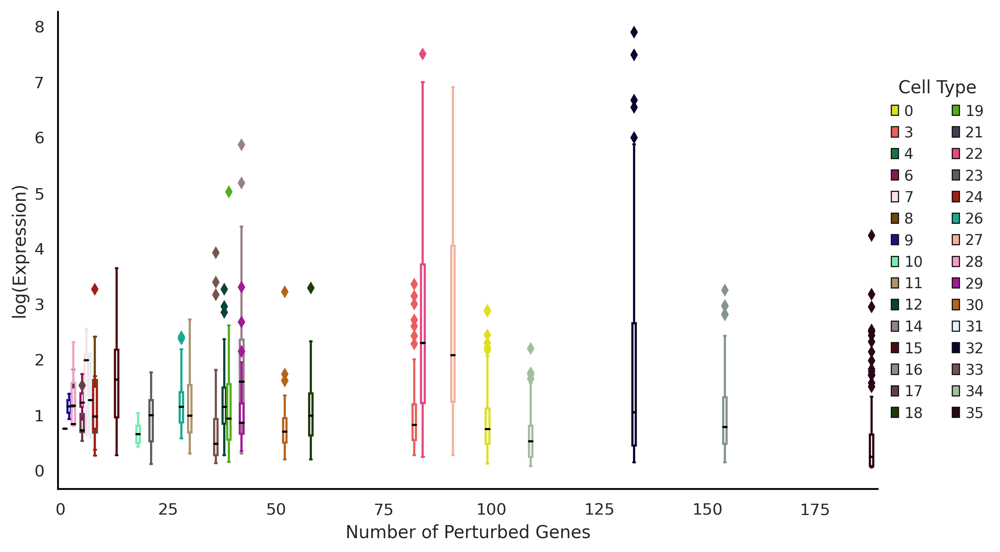

In [ ]:
palette = sns.color_palette(cmap_l)
fig, ax = plt.subplots(figsize=(10,6))
ax = sns.boxplot(x="numGenes", y="expr", hue='cellType',palette=palette, data=exprPlots,order=np.arange(190),dodge=False)


for i,artist in enumerate(ax.artists):
    # Set the linecolor on the artist to the facecolor, and set the facecolor to None
    col = artist.get_facecolor()
    artist.set_edgecolor(col)
    artist.set_facecolor('None')

    # Each box has 6 associated Line2D objects (to make the whiskers, fliers, etc.)
    # Loop over them here, and use the same colour as above
    for j in range(i*6,i*6+6):
        line = ax.lines[j]
        if j == (i*6+4):
          line.set_color('black')
          line.set_mfc('black')
          line.set_mec('black')
        else:
          line.set_color(col)
          line.set_mfc(col)
          line.set_mec(col)


ax.set_xlabel('Number of Perturbed Genes')
ax.set_ylabel('log(Expression)')
ax.grid(False)

for edge_i in ['bottom','left']:
    ax.spines[edge_i].set_edgecolor("black")
for edge_i in ['top', 'right']:
    ax.spines[edge_i].set_edgecolor("white")
ax.legend(loc='center left',bbox_to_anchor=(1, 0.5),prop={'size': 10},frameon=False,ncol=2,title="Cell Type")


for i in range(190):
     if i % 25 != 0:
       ax.xaxis.get_major_ticks()[i].draw = lambda *args:None


plt.show()

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


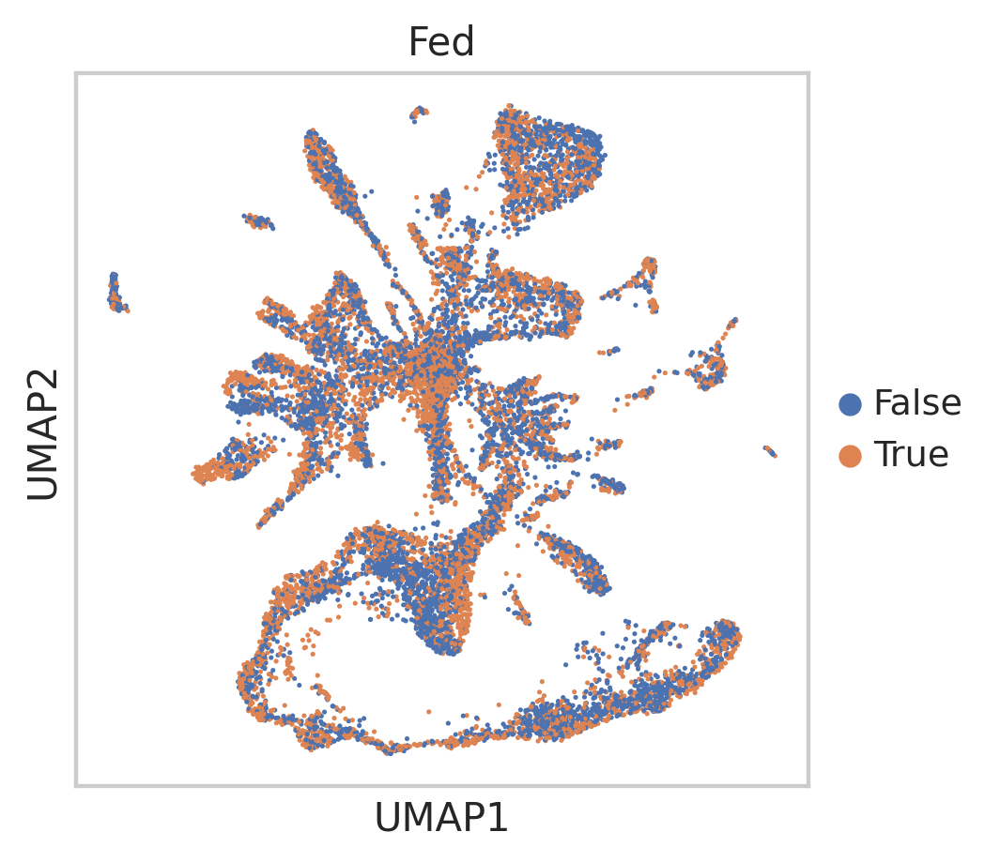

Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


In [ ]:
clus14 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([14])]
clus14.obs['Condition2'] = pd.Categorical(clus14.obs['fed'])
clus19 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([19])]
clus19.obs['Condition2'] = pd.Categorical(clus19.obs['fed'])

In [ ]:
newOfInterest = ['XLOC_043836','XLOC_043846','XLOC_007437','XLOC_009798','XLOC_008632','XLOC_033541','XLOC_004011'] 

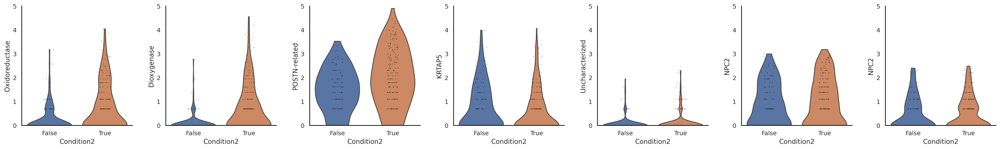

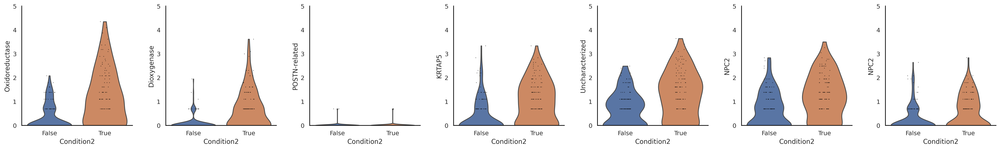

In [ ]:
axes = sc.pl.violin(clus14, newOfInterest, groupby='Condition2',ylabel=['Oxidoreductase','Dioxygenase',
                                                                        'POSTN-related','KRTAP5','Uncharacterized','NPC2','NPC2'],show=False)
for ax in axes:
  ax.set_ylim(0, 5)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 
axes = sc.pl.violin(clus19, newOfInterest, groupby='Condition2',ylabel=['Oxidoreductase','Dioxygenase',
                                                                        'POSTN-related','KRTAP5','Uncharacterized','NPC2','NPC2'],show=False)
for ax in axes:
  ax.set_ylim(0, 5)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 

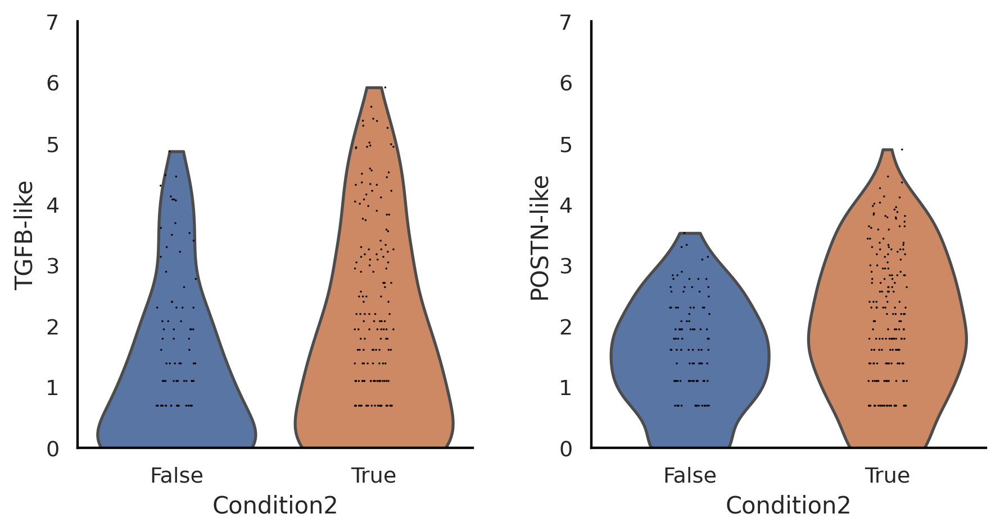

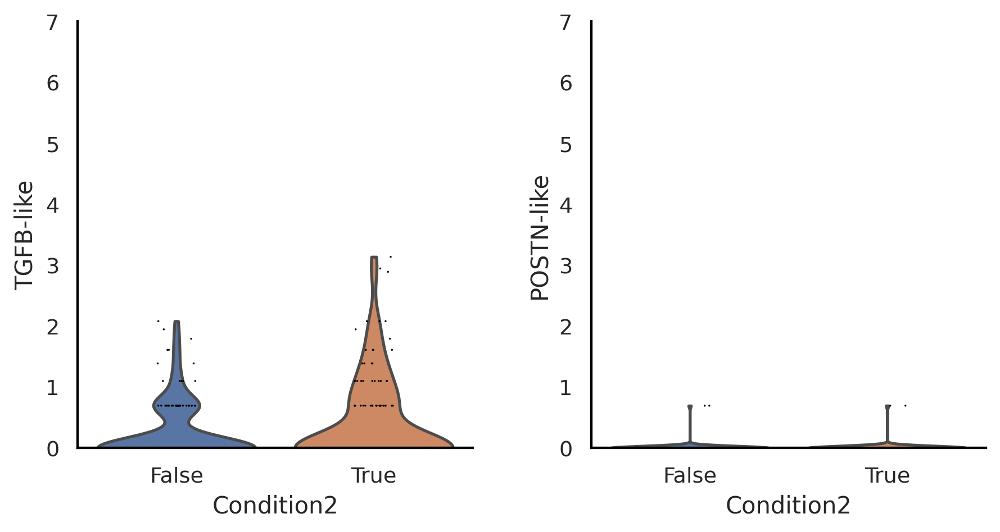

In [ ]:
newOfInterest = ['XLOC_035232','XLOC_007437'] 
axes = sc.pl.violin(clus14, newOfInterest, groupby='Condition2',ylabel=['TGFB-like',
                                                                        'POSTN-like'],show=False)
for ax in axes:
  ax.set_ylim(0, 7)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 

axes = sc.pl.violin(clus19, newOfInterest, groupby='Condition2',ylabel=['TGFB-like',
                                                                        'POSTN-like'],show=False)
for ax in axes:
  ax.set_ylim(0, 7)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 

In [ ]:
#Cluster 35, early oocytes Violin Plots

bus_fs_clus.obs['fed'] = pd.Categorical(bus_fs_clus.obs['fed'])
clus35 = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'].isin([35])]


Trying to set attribute `.obs` of view, copying.


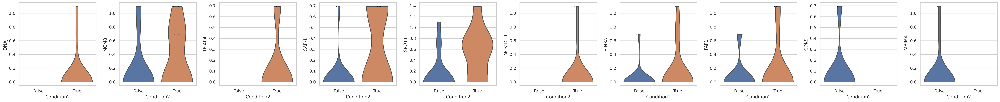

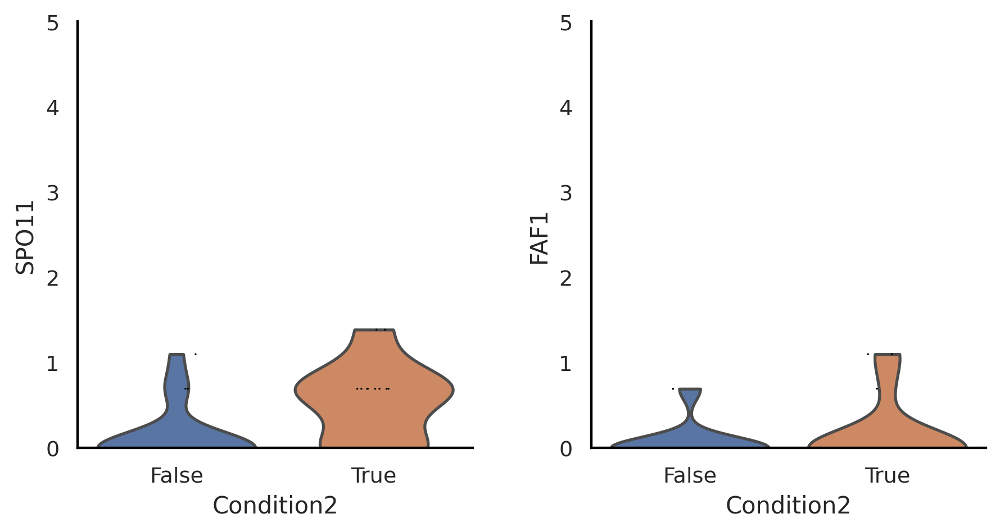

In [ ]:
newOfInterest = ['XLOC_012655','XLOC_004306','XLOC_037567','XLOC_006902','XLOC_016286','XLOC_037771',
                 'XLOC_035249','XLOC_012527','XLOC_001916','XLOC_015039']

clus35.obs['Condition2'] = pd.Categorical(clus35.obs['fed'])
#sc.pl.umap(clus35, color='Condition')
sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['DNAJ','MCM8','TF AP4','CAF-1','SPO11','MOV10L1',
                                                                 'SIN3A','FAF1','CDK9','TMBIM4'])



newOfInterest = ['XLOC_016286','XLOC_012527']
#sc.pl.umap(clus35, color='Condition')
axes = sc.pl.violin(clus35, newOfInterest, groupby='Condition2',ylabel=['MEIOTIC RECOMBINATION PROTEIN','FAF1'],show=False)

for ax in axes:
  ax.set_ylim(0, 5)
  ax.grid(False)
  ax.spines['right'].set_visible(False)
  ax.spines['top'].set_visible(False)
  ax.spines['bottom'].set_color('black')
  ax.spines['left'].set_color('black') 


####**Overlap with Original CellRanger Clusters** 

Use Jaccard Index to quantify overlap of markers for the 36 cell types between the Kallisto-processed and initial, Cell Ranger processed data

In [ ]:
n=100
bus_fs_clus = anndata.read("D1.1796")
cellRanger_fs = anndata.read("D1.1798")

bus_fs_clus.obs['cellRanger_louvain'] = pd.Categorical(bus_fs_clus.obs['cellRanger_louvain'])
sc.tl.rank_genes_groups(cellRanger_fs,groupby='louvain',n_genes=n,method='wilcoxon')
sc.tl.rank_genes_groups(bus_fs_clus,groupby='cellRanger_louvain',n_genes=n,method='wilcoxon')

In [ ]:
#Show pairwise overlap in top 100 names between all clusters, 36x36 grid
clus = np.unique(bus_fs_clus.obs['cellRanger_louvain'])

cellR = [[]]*len(clus) #np array of top 100 genes for each of 36 clusters
busFS = [[]]*len(clus)#np array of top 100 genes for each of 36 clusters

for c in clus:
  cellR[c] =  list(cellRanger_fs.uns['rank_genes_groups']['names'][str(c)])
  busFS[c] = list(bus_fs_clus.uns['rank_genes_groups']['names'][str(c)])


In [ ]:
#https://stackoverflow.com/questions/52408910/python-pairwise-intersection-of-multiple-lists-then-sum-up-all-duplicates

In [ ]:
from itertools import combinations_with_replacement

#Changed to calculate Jaccard Index
def intersect(i,j):
  return len(set(cellR[i]).intersection(busFS[j]))/len(set(cellR[i]).union(busFS[j]))

def pairwise(clus):        
  # Initialise precomputed matrix (num of clusters, 36x36)
  precomputed = np.zeros((len(clus),len(clus)), dtype='float')
  # Initialise iterator over objects in X
  iterator = combinations_with_replacement(range(0,len(clus)), 2)
  # Perform the operation on each pair
  for i,j in iterator:
    precomputed[i,j] = intersect(i,j)          
  # Make symmetric and return
  return precomputed + precomputed.T - np.diag(np.diag(precomputed))


In [ ]:
pairCorrs = pairwise(clus)

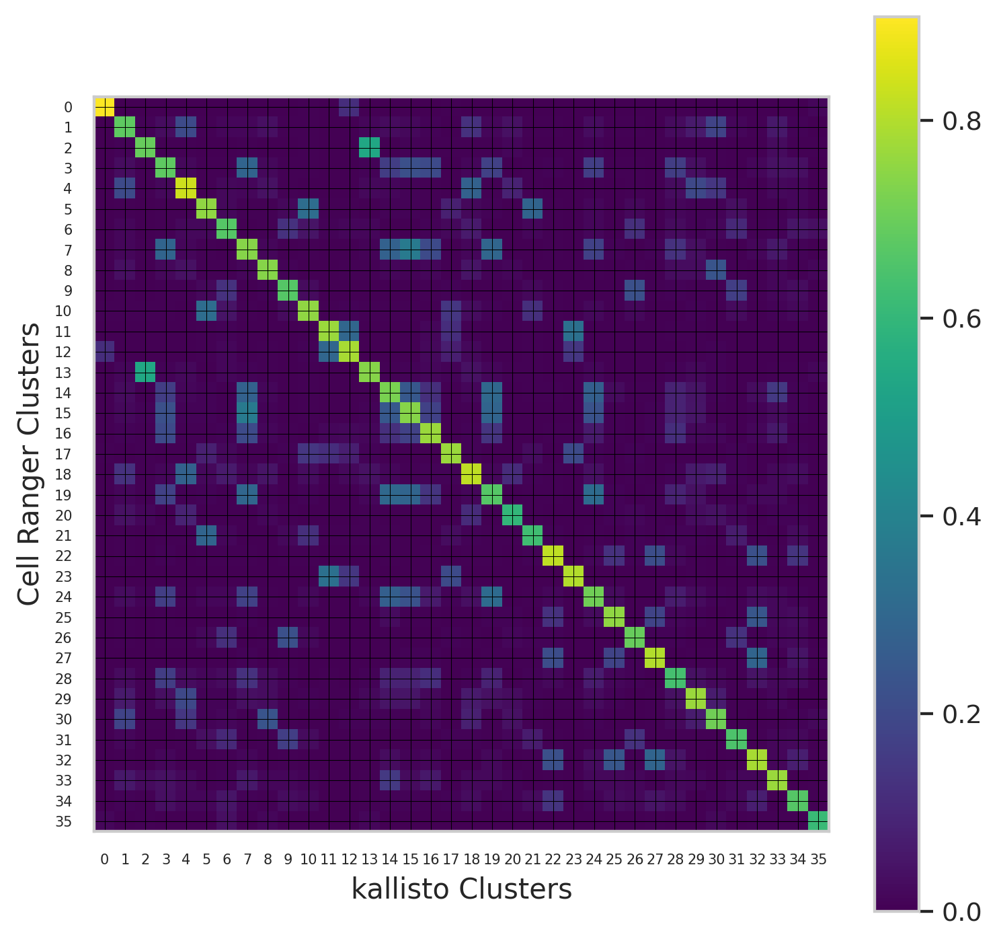

In [ ]:
plt.figure(figsize=(7,7))
plt.imshow(pairCorrs, cmap='viridis')
plt.colorbar()
plt.xlabel('kallisto Clusters')
plt.ylabel('Cell Ranger Clusters')

plt.xticks(np.arange(0, 36, 1),fontsize=6)
plt.yticks(np.arange(0, 36, 1),fontsize=6)
plt.grid(color='black',linewidth=0.3)
plt.show()

#### **Cell Type Data for SplitsTree**

In [ ]:
print(bus_fs_clus)

from sklearn.metrics import pairwise_distances

#Centroids of cell atlas/defined clusters
def getClusCentroids(overlap_combo,pcs=60,clusType='knn_clus'):
    clusters = np.unique(overlap_combo.obs[clusType])
    centroids = np.zeros((len(clusters),pcs))
    
    for c in clusters:
        
        sub_data = overlap_combo[overlap_combo.obs[clusType] == c]
        pca_embed = sub_data.obsm['X_pca'][:,0:pcs]
        centroid = pca_embed.mean(axis=0)
        
        centroids[int(c),:] = list(centroid)
        
    return centroids

AnnData object with n_obs × n_vars = 13673 × 8696
    obs: 'batch', 'n_counts', 'n_countslog', 'louvain', 'leiden', 'orgID', 'fed', 'starved', 'fed_neighbor_score', 'cellRanger_louvain', 'annos', 'new_cellRanger_louvain', 'annosSub'
    var: 'n_counts', 'mean', 'std'
    uns: 'annosSub_colors', 'annos_colors', 'cellRanger_louvain_colors', 'cellRanger_louvain_sizes', "dendrogram_['new_cellRanger_louvain']", 'dendrogram_new_cellRanger_louvain', 'fed_colors', 'fed_neighbor_score_colors', 'leiden', 'leiden_colors', 'louvain', 'louvain_colors', 'neighbors', 'new_cellRanger_louvain_colors', 'orgID_colors', 'paga', 'pca', 'rank_genes_groups', 'umap'
    obsm: 'X_nca', 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'


In [ ]:
#Compare to pairwise distances between cell atlas clusters
fed_only = bus_fs_clus[bus_fs_clus.obs['fed'] == 'True']
centroids = getClusCentroids(fed_only,60,'cellRanger_louvain')
#centroids_arr = centroids['centroid'].to_numpy()
pairCentroid_dists = pairwise_distances(centroids, metric = 'l1')
pairCentroid_dists.shape


(36, 36)

In [ ]:

clus = np.unique(fed_only.obs['cellRanger_louvain'])
df = pd.DataFrame(pairCentroid_dists)
df['cluster'] = range(0,len(clus))

clusters = [int(i) for i in fed_only.obs['cellRanger_louvain']]
annos = fed_only.obs['annosSub']

annosDict = {}
for i in range(0,len(clusters)):
  annosDict[clusters[i]] = annos[i]


names = [annosDict[i] for i in df['cluster']]

df['annos'] = names
df.head()

df.to_csv('cellTypeDist_SplitsTree.csv')

In [ ]:
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,cluster,annos
0,0.000000,73.464909,65.525303,75.936037,74.636204,85.283588,73.824954,82.401569,75.196994,89.087199,99.485741,106.611646,54.108183,120.785654,108.300500,99.363475,95.612621,129.268401,110.133130,142.236416,77.468914,135.696652,128.288597,135.917111,138.019980,128.605249,129.160607,189.208824,96.878118,138.443425,110.750130,182.934958,237.364691,132.279790,226.214219,217.054862,0,Stem Cells
1,73.464909,0.000000,73.655777,70.877597,77.173203,89.054201,79.136972,76.645835,80.323026,87.011464,105.366511,117.057891,80.386629,119.954732,105.483109,96.652534,104.324513,139.127698,102.092035,121.881019,84.260834,138.856221,118.074936,131.726808,123.111721,131.677083,124.471839,171.451975,111.999539,148.526727,113.647093,178.768390,218.127628,135.157440,239.898399,266.314562,1,Exumbrella Epidermis
2,65.525303,73.655777,0.000000,64.303731,68.100740,81.223223,80.838113,77.755090,78.419210,84.807741,98.161895,103.657681,72.123625,96.296266,112.966357,86.755541,99.595890,125.994965,109.128990,145.543685,49.520744,140.668973,110.204552,134.502650,128.123380,119.130684,117.597645,187.189022,94.002531,142.049688,111.176973,174.081892,228.301164,109.351743,233.731906,245.953266,2,Large Oocytes
3,75.936037,70.877597,64.303731,0.000000,72.357871,87.616355,86.604400,60.036329,91.686399,93.482419,105.186968,110.185755,77.286173,122.598505,103.684279,79.500823,93.338071,128.078706,109.438380,131.196984,70.998642,143.392353,121.166188,126.212171,112.271870,130.067005,132.364972,186.111448,96.825716,135.182865,114.170083,186.398904,215.861273,123.974192,231.286331,255.491559,3,Digestive Subtype 1
4,74.636204,77.173203,68.100740,72.357871,0.000000,88.802717,85.075363,80.497037,85.861816,94.622659,105.989449,114.388857,79.916953,124.872919,122.905036,97.065098,101.276803,139.583311,104.866280,145.690134,68.573588,147.198918,125.230667,141.370164,131.855025,131.689243,127.044982,185.315343,103.332901,118.784507,98.033347,178.431799,234.030079,129.508063,237.051490,250.430968,4,Manubrium Epidermis


Data for SplitsTree analysis of all cells within cell types of interest

In [ ]:
def convertCond(fed):
  if fed == 'True':
    return 'Control'
  else:
    return 'Starved'

In [ ]:
#Save csv for cell type 14 (dig. gastroderm type)
pcs=60
sub = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'] == 14]
pca_embed = sub.obsm['X_pca'][:,0:pcs]
cellDists = pairwise_distances(pca_embed, metric = 'l1')

df = pd.DataFrame(cellDists)

conds =  [convertCond(i) for i in sub.obs['fed']]
for i in range(0,len(conds)):
  conds[i] = conds[i]+'_'+str(i)

df['annos'] = conds
df['cluster'] = np.repeat(14,len(conds))

df.to_csv('cells14Dist_SplitsTree.csv')

df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,annos,cluster
0,0.000000,94.143427,48.626253,101.574068,109.223591,186.350220,190.945339,194.066881,156.403821,218.048962,168.793326,137.715137,179.836035,149.927222,195.354427,233.945757,166.067516,136.096284,216.107262,199.529440,193.207474,182.298597,178.294928,213.548189,172.876985,184.106836,181.708748,212.022591,195.449468,163.745207,163.936970,212.432469,191.489405,229.737238,203.838168,192.304306,189.078393,182.772713,230.196760,200.160259,...,229.297610,302.022273,103.226011,246.180590,79.685577,228.837330,179.028481,175.254564,204.683130,132.183881,190.640601,188.083746,174.172712,127.577098,91.216964,186.637843,220.118893,174.819850,106.416963,90.373066,98.419187,109.399699,181.359886,196.729804,157.085444,133.338628,161.478459,209.860675,186.578729,210.796355,210.508243,210.962729,153.360147,169.810844,214.112565,124.262565,163.718460,196.192738,Control_0,14
1,94.143427,0.000000,86.390540,58.534484,73.824113,153.057557,144.543805,144.581489,177.692855,163.166209,156.282159,101.568765,133.849859,105.531266,158.145493,182.800918,137.467117,150.280211,168.261541,193.167339,137.709932,173.786182,131.830320,164.291988,106.345033,152.030092,135.129226,157.747258,147.633373,122.283538,115.482289,169.319059,150.128244,186.767662,151.456408,152.404536,154.228067,158.826242,181.862659,158.542549,...,191.266843,271.680207,84.215284,199.883731,41.845021,175.484402,126.961714,127.455923,168.441797,123.490639,137.286613,138.587477,126.644105,91.531271,36.178894,129.433266,234.363872,136.274003,84.452477,95.836442,56.339853,64.970466,158.308563,182.310413,154.223460,103.979841,107.624468,153.881173,145.742968,195.334608,169.259788,149.438632,159.529412,131.624746,163.498180,102.808167,118.140950,162.508761,Control_1,14
2,48.626253,86.390540,0.000000,97.736700,98.147891,164.746364,184.626710,178.048935,149.629548,213.443877,147.289196,123.705298,168.429515,143.842020,179.956767,213.739130,143.481182,135.920917,206.268016,174.021207,182.332838,155.756659,164.451219,214.787755,162.804292,164.391505,169.553513,199.173782,185.730899,152.403594,156.011609,193.935450,167.398094,222.720465,201.603039,175.217648,180.261124,152.206669,228.494801,190.030389,...,220.140234,294.730742,85.742543,240.889364,71.882806,222.800527,166.456497,175.917007,181.432335,113.941515,187.045217,176.779761,168.326184,132.838011,80.586767,177.987493,212.425775,164.874481,88.778732,71.622405,83.718424,98.078372,157.648039,186.338032,144.322076,119.795497,149.711772,206.515952,187.489883,219.176888,207.909479,205.898141,131.169522,157.164535,194.733981,111.197437,150.988701,169.121609,Control_2,14
3,101.574068,58.534484,97.736700,0.000000,75.298443,161.961798,143.317353,149.625743,173.866739,142.182168,157.130683,94.061077,128.427204,103.337065,155.178435,177.437357,141.917049,167.117992,154.682007,205.637233,136.567256,176.289161,124.402694,136.016197,93.230688,157.686644,136.545843,139.872165,123.517754,129.625700,111.319758,165.674834,154.912371,177.827547,127.548855,155.486745,145.820134,170.591673,159.679090,152.910245,...,166.074201,277.655783,73.963112,181.608547,69.183016,153.739582,124.156899,106.971703,171.007710,125.184050,128.177026,124.388380,107.059112,87.626529,58.429277,130.799655,245.649857,121.897359,75.102888,91.946107,68.707121,75.724273,171.676829,182.136511,164.883143,99.161451,116.528071,128.388914,129.884990,203.863351,159.806983,140.013943,167.867174,137.436931,160.685175,90.797872,94.354009,176.591642,Control_3,14
4,109.223591,73.824113,98.147891,75.298443,0.000000,132.009158,134.578927,135.770046,143.583777,155.297091,127.364356,77.128204,115.733704,106.414797,133.832323,157.963138,103.322510,149.783598,163.513924,173.290917,130.087097,151.744598,126.224322,160.863930,100.

In [ ]:
#Save csv for cell type 8 
pcs=60
sub = bus_fs_clus[bus_fs_clus.obs['cellRanger_louvain'] == 8]
pca_embed = sub.obsm['X_pca'][:,0:pcs]
cellDists = pairwise_distances(pca_embed, metric = 'l1')

df = pd.DataFrame(cellDists)

conds =  [convertCond(i) for i in sub.obs['fed']]

for i in range(0,len(conds)):
  conds[i] = conds[i]+'_'+str(i)

df['annos'] = conds
df['cluster'] = np.repeat(8,len(conds))

df.to_csv('cells8Dist_SplitsTree.csv')

df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,...,551,552,553,554,555,556,557,558,559,560,561,562,563,564,565,566,567,568,569,570,571,572,573,574,575,576,577,578,579,580,581,582,583,584,585,586,587,588,annos,cluster
0,0.000000,60.144983,76.372043,66.494132,56.432907,106.750517,63.259248,64.543560,103.313487,88.505627,62.510605,62.839743,54.117143,60.876416,69.241539,49.890980,63.115900,75.901447,65.833620,46.972126,59.117521,50.828162,64.611214,83.392522,54.228186,60.750958,61.832451,65.970672,56.634726,62.320127,60.930371,94.799349,54.312209,80.935857,56.469866,78.045338,97.414141,47.106535,52.340316,47.393314,...,56.317990,78.665763,102.519642,54.470162,74.206045,71.110467,57.144690,60.212767,94.438412,64.947516,58.463693,96.371474,70.982465,68.470088,55.454763,90.557976,69.057868,57.370530,110.705628,62.855537,55.911682,78.440062,65.798097,64.860006,82.284685,78.548047,60.363950,47.283687,118.235103,61.281831,62.095791,70.993424,63.176492,82.638864,65.643171,49.659580,72.415766,100.235864,Control_0,8
1,60.144983,0.000000,86.442079,83.235973,51.924538,118.189361,69.300209,69.237901,111.011623,96.840631,66.761150,62.787025,64.509542,70.040120,82.535353,57.042035,62.217727,50.519683,50.821090,44.514138,56.116313,44.747514,55.996851,65.429151,58.836193,53.755685,63.995224,73.764828,80.625462,60.245426,70.809966,77.816029,57.881604,93.299843,47.710753,91.230807,118.168571,54.537929,54.853684,44.323889,...,52.669083,87.858019,116.350319,68.076112,84.519127,92.341931,58.762293,77.746750,103.652715,52.284794,71.777005,96.288046,79.784954,84.964503,50.106554,58.830359,46.453382,51.187307,119.734781,60.088097,55.391921,93.297142,56.703107,57.903604,92.084961,57.693223,76.727119,57.380273,123.147671,45.369704,58.613022,58.896148,77.726322,85.332088,79.407758,53.452267,63.079363,112.651485,Control_1,8
2,76.372043,86.442079,0.000000,92.197382,63.272943,105.308902,72.240901,63.892020,70.177240,56.916090,61.509721,60.661871,58.840806,50.095664,52.716062,60.069598,87.517705,86.563938,73.395764,74.351870,69.882013,76.141038,84.990894,105.735411,68.030166,70.006578,48.973458,48.041114,82.686475,90.131740,54.633708,118.670893,56.979855,62.765306,77.565609,46.419926,70.692113,77.078970,61.443398,75.723481,...,90.866300,64.740272,104.697828,50.934523,58.325615,56.903474,76.533149,59.223939,106.632709,87.948440,53.746843,141.567596,51.720590,56.263659,78.111106,105.336517,96.708537,66.323087,80.872255,102.348394,71.995598,51.604319,79.604278,87.046409,102.458091,84.284729,51.868968,60.383201,109.956103,66.412003,88.741395,98.565783,60.074302,75.270098,53.960435,68.212597,83.672812,83.044235,Starved_2,8
3,66.494132,83.235973,92.197382,0.000000,76.283285,100.474915,59.714631,75.692691,105.347625,96.883744,84.592759,77.868867,71.077264,71.623509,85.937109,68.892743,73.558295,102.805204,91.201422,76.869735,84.751180,70.014629,85.987749,104.618756,75.588171,80.724889,82.444481,84.341322,55.293334,76.457045,64.812197,103.164522,66.077887,81.304880,80.937751,86.652107,104.123518,70.264511,65.563247,74.535903,...,71.922489,86.318574,106.602828,77.004801,86.556066,83.766100,66.018927,77.703502,95.756355,84.888723,78.641428,88.892761,91.098623,86.168107,80.344344,109.601149,87.865686,79.999816,106.091861,73.944167,74.653632,94.131515,92.263945,75.156970,68.755884,93.553924,80.329967,69.485267,105.038163,76.858074,79.582475,92.043199,72.041728,92.608716,80.959029,88.158541,74.342947,106.086149,Starved_3,8
4,56.432907,51.924538,63.272943,76.283285,0.000000,113.375482,70.604369,65.810346,99.366576,83.913583,61.056639,59.528658,55.141460,59.658959,64.488933,48.897210,59.044761,62.925647,55.318539,51.081762,57.109698,44.735403,57.856466,82.044829,60.552988,58.173658,60.841931,64.581594,75.487261,62.866149,57.990504,89.923440,46.204944,86.102504,52.315008,66.294960,96.090289,50.348422,52.381180,40.238280,...,63.998809,81.335290,109.842015,49.136437,78.641090,70.909253,63.480354,62.613485,113.27259

array([0, 0, 0, 0, 0])